# Finding Fraudsters 
**Group Project by:** Zamiul Alam, Alex Gekow, Kazi Aatish Imroz, Roshan Joshi, Kayode Oyedele \
Submitted as part of the Data Science Bootcamp by the Erdős Institute.

# Exploratory Data Analysis

We import the necessary modules.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 150)

We read the 4 files provided in the competetion. The files are as follow: 
1. `id`= Dataset containing 41 id features for the training data
2. `tranz` = Dataset containing 394 transaction features for the training data
3. `id_test` = Dataset containing 41 id features for the test data
4. `tranz_test` = Dataset containing 394 transaction features for the test data

In [2]:
path1 = '/Users/zamiulalam/Documents/Fraud/ieee-fraud-detection/train_identity.csv'
path2 = '/Users/zamiulalam/Documents/Fraud/ieee-fraud-detection/train_transaction.csv'
path3 = '/Users/zamiulalam/Documents/Fraud/ieee-fraud-detection/test_identity.csv'
path4 = '/Users/zamiulalam/Documents/Fraud/ieee-fraud-detection/test_transaction.csv'

id = pd.read_csv(path1)
tranz = pd.read_csv(path2)
id_test = pd.read_csv(path3)
tranz_test = pd.read_csv(path4)

We look at the id training dataset.

In [3]:
id.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,52.0,NaN,Found,Found,121.0,NaN,410.0,142.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,NaN,New,NotFound,225.0,NaN,176.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,NaN,-300.0,Found,Found,166.0,15.0,529.0,575.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Mac OS X 10_11_6,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [4]:
id.describe()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_13,id_14,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32
count,1.442330e+05,144233.000000,140872.000000,66324.000000,66324.000000,136865.000000,136865.000000,5155.000000,5155.000000,74926.000000,74926.000000,140978.000000,127320.000000,80044.000000,139369.000000,45113.000000,139318.000000,139261.000000,5159.000000,5169.000000,4747.000000,5132.000000,5163.000000,77586.000000
mean,3.236329e+06,-10.170502,174716.584708,0.060189,-0.058938,1.615585,-6.698710,13.285354,-38.600388,0.091023,-0.301124,99.745325,48.053071,-344.507146,189.451377,14.237337,353.128174,403.882666,368.269820,16.002708,12.800927,329.608924,149.070308,26.508597
std,1.788496e+05,14.347949,159651.816856,0.598231,0.701015,5.249856,16.491104,11.384207,26.084899,0.983842,2.789446,1.127602,11.774858,93.695502,30.375360,1.561302,141.095343,152.160327,198.847038,6.897665,2.372447,97.461089,32.101995,3.737502
min,2.987004e+06,-100.000000,1.000000,-13.000000,-28.000000,-72.000000,-100.000000,-46.000000,-100.000000,-36.000000,-100.000000,90.000000,10.000000,-660.000000,100.000000,10.000000,100.000000,100.000000,100.000000,10.000000,11.000000,100.000000,100.000000,0.000000
25%,3.077142e+06,-10.000000,67992.000000,0.000000,0.000000,0.000000,-6.000000,5.000000,-48.000000,0.000000,0.000000,100.000000,49.000000,-360.000000,166.000000,13.000000,266.000000,256.000000,252.000000,14.000000,11.000000,321.000000,119.000000,24.000000
50%,3.198818e+06,-5.000000,125800.500000,0.000000,0.000000,0.000000,0.000000,14.000000,-34.000000,0.000000,0.000000,100.000000,52.000000,-300.000000,166.000000,15.000000,341.000000,472.000000,252.000000,14.000000,11.000000,321.000000,149.000000,24.000000
75%,3.392923e+06,-5.000000,228749.000000,0.000000,0.000000,1.000000,0.000000,22.000000,-23.000000,0.000000,0.000000,100.000000,52.000000,-300.000000,225.000000,15.000000,427.000000,533.000000,486.500000,14.000000,15.000000,371.000000,169.000000,32.000000
max,3.577534e+06,0.000000,999595.000000,10.000000,0.000000,52.000000,0.000000,61.000000,0.000000,25.000000,0.000000,100.000000,64.000000,720.000000,229.000000,29.000000,671.000000,661.000000,854.000000,44.000000,26.000000,548.000000,216.000000,32.000000


In [5]:
id.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144233 entries, 0 to 144232
Data columns (total 41 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   TransactionID  144233 non-null  int64  
 1   id_01          144233 non-null  float64
 2   id_02          140872 non-null  float64
 3   id_03          66324 non-null   float64
 4   id_04          66324 non-null   float64
 5   id_05          136865 non-null  float64
 6   id_06          136865 non-null  float64
 7   id_07          5155 non-null    float64
 8   id_08          5155 non-null    float64
 9   id_09          74926 non-null   float64
 10  id_10          74926 non-null   float64
 11  id_11          140978 non-null  float64
 12  id_12          144233 non-null  object 
 13  id_13          127320 non-null  float64
 14  id_14          80044 non-null   float64
 15  id_15          140985 non-null  object 
 16  id_16          129340 non-null  object 
 17  id_17          139369 non-nul

We find out what percentage of the columns are missing values

In [6]:
#Find the number of missing values in each column
miss_val_id = id.isnull().sum()

#Turn the missing value counts into percentages
miss_val_per_id = (miss_val_id/ len(id))*100

#Return counts and percentages of missing values in each column
miss_data_id = pd.DataFrame({'Missing Values': miss_val_id,'Percentage (%)':miss_val_per_id})

#Sort values in ascending order 
miss_data_id.sort_values(by='Percentage (%)', ascending=True)

,Missing Values,Percentage (%)
TransactionID,0,0.000000
id_01,0,0.000000
id_12,0,0.000000
id_38,3248,2.251912
id_37,3248,2.251912
id_36,3248,2.251912
id_35,3248,2.251912
id_15,3248,2.251912
id_29,3255,2.256765
id_28,3255,2.256765


We look at the transactions training dataset.

In [7]:
tranz.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,...,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,F,F,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,28.0,0.0,0.0,0.0,0.0,10.0,0.0,4.0,0.0,0.0,1.0,1.0,1.0,1.0,38.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [8]:
tranz.describe()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,...,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,5.905400e+05,590540.000000,5.905400e+05,590540.000000,590540.000000,581607.000000,588975.000000,586281.000000,524834.000000,524834.000000,238269.000000,37627.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,589271.000000,309743.000000,327662.000000,421618.000000,280699.000000,73187.000000,38917.000000,74926.000000,74926.000000,514518.000000,311253.000000,64717.000000,61952.000000,62187.000000,501427.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,...,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,141416.000000,141416.000000,141416.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,590528.000000,590528.000000,589271.000000,589271.000000,589271.000000,590528.000000,590528.000000,590528.000000,590528.000000,589271.000000,589271.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,589271.000000,590528.000000,590528.000000,590528.000000,589271.000000,589271.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,589271.000000,589271.000000,589271.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.00000,82351.000000,82351.000000,82351.000000,82351.000000
mean,3.282270e+06,0.034990,7.372311e+06,135.027176,9898.734658,362.555488,153.194925,199.278897,290.733794,86.800630,118.502180,231.855423,14.092458,15.269734,0.005644,4.092185,5.571526,9.071082,2.848478,5.144574,4.480240,5.240343,10.241521,4.076227,32.539918,8.295215,94.347568,169.563231,28.343348,140.002441,42.335965,69.805717,41.638950,146.058108,0.561057,123.982137,146.621465,54.037533,17.901295,57.724444,163.744579,0.999945,1.045204,1.078075,0.846456,0.876991,1.045686,1.072870,1.027704,1.041529,0.463915,0.478987,0.559711,0.599166,0.999500,0.122342,0.123460,0.134040,0.135363,0.816371,0.847843,0.129684,0.132292,1.034791,1.058097,0.977660,0.988040,0.000776,0.000830,0.387840,0.406436,0.140761,0.142417,0.130693,0.139154,...,153.520534,9.167839,36.525103,18.813407,5.997508,7.712764,9.445133,8.464571,73.825549,107.151636,88.899939,31.797277,51.956645,42.328228,1.123061,1.967082,0.087783,0.817171,0.991114,0.088543,1.167660,0.031492,0.358579,0.184350,0.235975,1.103011,1.659811,1.239916,0.942599,2.313863,1.433424,0.328917,0.089034,0.298829,0.171655,0.045507,0.052002,0.251761,0.283140,0.264208,1.000007,139.748713,408.682375,230.413180,10.995986,118.195658,4.202175,39.173910,21.351473,43.319174,26.80697

In [9]:
tranz.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 590540 entries, 0 to 590539
Columns: 394 entries, TransactionID to V339
dtypes: float64(376), int64(4), object(14)
memory usage: 1.7+ GB


We find which columns have the highest percentage of missing values.

In [10]:
#Find the number of missing values in each column
miss_val_tranz = tranz.isnull().sum()

#Turn the missing value counts into percentages
miss_val_per_tranz = (miss_val_tranz/ len(tranz))*100

#Return counts and percentages of missing values in each column
miss_data_tranz = pd.DataFrame({'Missing Values': miss_val_tranz,'Percentage (%)':miss_val_per_tranz})

#Sort values in ascending order 
miss_data_tranz = miss_data_tranz.sort_values(by='Percentage (%)', ascending=True)

miss_data_tranz.tail(50)

,Missing Values,Percentage (%)
V324,508189,86.054967
V323,508189,86.054967
V331,508189,86.054967
V330,508189,86.054967
V332,508189,86.054967
V337,508189,86.054967
V334,508189,86.054967
V335,508189,86.054967
V336,508189,86.054967
V322,508189,86.054967


We perform the necessary steps to combine the id and transaction features for the training and test data.

In [11]:
tranz = tranz.merge(id, how='left', on='TransactionID')
tranz_test = tranz_test.merge(id_test, how = 'left', on = 'TransactionID')

To get an idea about the dataset, we find out the number of unique values in each column and look at the first 10 values.

In [30]:
for col, values in tranz.items():
    num_uniques = values.nunique()
    print ('{name}: {num_unique}'.format(name=col, num_unique=num_uniques))
    print (values.unique()[0:10])
    print ('\n')

TransactionID: 590540
[2987000 2987001 2987002 2987003 2987004 2987005 2987006 2987007 2987008
 2987009]


isFraud: 2
[0 1]


TransactionDT: 573349
[86400 86401 86469 86499 86506 86510 86522 86529 86535 86536]


TransactionAmt: 20902
[ 68.5    29.     59.     50.     49.    159.    422.5    15.    117.
  75.887]


ProductCD: 5
['W' 'H' 'C' 'S' 'R']


card1: 13553
[13926  2755  4663 18132  4497  5937 12308 12695  2803 17399]


card2: 500
[ nan 404. 490. 567. 514. 555. 360. 100. 111. 352.]


card3: 114
[150. 117. 185. 143. 144. 163. 146. 191. 162. 119.]


card4: 4
['discover' 'mastercard' 'visa' 'american express' nan]


card5: 119
[142. 102. 166. 117. 226. 224. 134. 219. 137. 195.]


card6: 4
['credit' 'debit' nan 'debit or credit' 'charge card']


addr1: 332
[315. 325. 330. 476. 420. 272. 126. 337. 204.  nan]


addr2: 74
[87. nan 96. 35. 60. 98. 43. 65. 32. 13.]


dist1: 2651
[ 19.  nan 287.  36.   0.   3.   5.   4.  17.  13.]


dist2: 1751
[ nan  30.  98. 149.  84. 100. 744. 109.   7.

We also make a countplot.

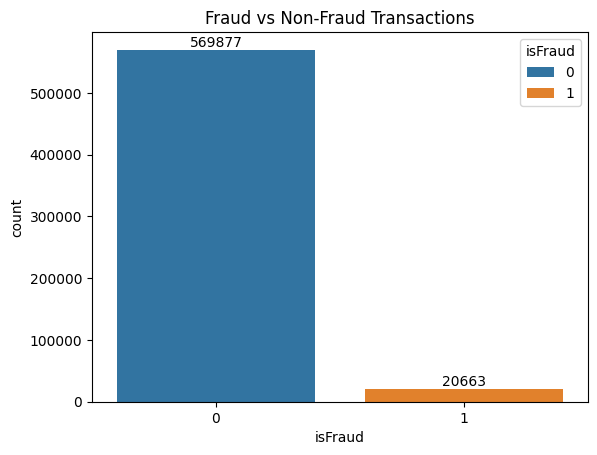

In [14]:
ax = sns.countplot(x='isFraud', data=tranz, hue='isFraud')
plt.title('Fraud vs Non-Fraud Transactions')

for container in ax.containers:
    ax.bar_label(container) # type: ignore

plt.show()

We make a pie chart to see what percentage of the values are fraud. Here, 1 correspnds to fraud and 0 to non-fraud.

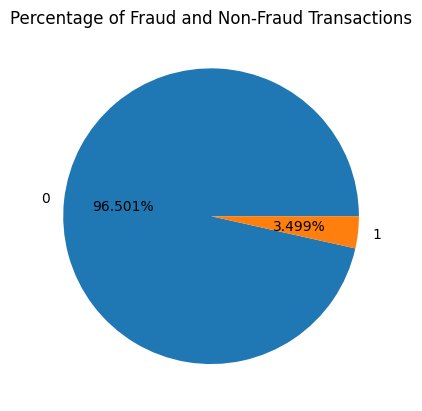

In [15]:
# get the set of distinct classes
labelz = tranz.isFraud.unique()

sizes = tranz.isFraud.value_counts().values

# plot the class value counts
fig, ax = plt.subplots()
ax.pie(np.array(sizes), labels=labelz.astype(str).tolist(), autopct='%1.3f%%')
ax.set_title('Percentage of Fraud and Non-Fraud Transactions')
plt.show()

`TransactionDT` is given in seconds, so we can convert it to days. We see that the training data spans 180 days or 6 months.

In [16]:
(tranz['TransactionDT'].max() - tranz['TransactionDT'].min())/ 86400

181.99920138888888

We don't know the actual date from which the data was taken. But it is possible to create a random timestamp and keep track of the day of month and hour of day using `pd.to_datetime`.

In [31]:
tranz['TransactionDTz'] = pd.to_datetime(tranz['TransactionDT'], unit='s', origin=pd.Timestamp('2000-01-01'))
tranz_test['TransactionDTz'] = pd.to_datetime(tranz_test['TransactionDT'], unit='s', origin=pd.Timestamp('2000-01-01'))

In [32]:
tranz['Date'] = tranz['TransactionDTz'].dt.day
tranz['Hour'] = tranz['TransactionDTz'].dt.hour

We make a plot to see the average number of transactions per Day. Blue is non-fraud and Orange is Fraud.

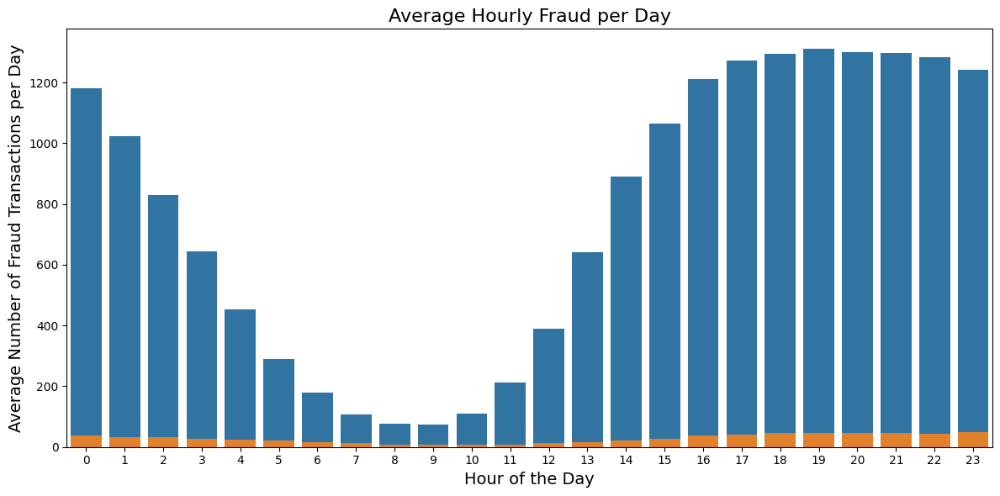

In [ ]:
# Group by date and hour, count fraud
daily_hourly_nfraud = tranz[tranz['isFraud'] == 0].groupby(['Date', 'Hour']).size().reset_index(name='Fraud_Count')
daily_hourly_fraud = tranz[tranz['isFraud'] == 1].groupby(['Date', 'Hour']).size().reset_index(name='Fraud_Count')

# Now, compute the average fraud count per hour across all days
hourly_avg_nf = daily_hourly_nfraud.groupby('Hour')['Fraud_Count'].mean().reset_index(name='Avg_Fraud_Per_Hour')
hourly_avg_f = daily_hourly_fraud.groupby('Hour')['Fraud_Count'].mean().reset_index(name='Avg_Fraud_Per_Hour')

# Plot the average hourly fraud
plt.figure(figsize=(12, 6))
sns.barplot(data=hourly_avg_nf, x='Hour', y='Avg_Fraud_Per_Hour')
sns.barplot(data=hourly_avg_f, x='Hour', y='Avg_Fraud_Per_Hour')
plt.title('Average Hourly Transactions per Day', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Average Number of Transactions per Day', fontsize=14)
plt.tight_layout()
plt.show()

Not sure hot to interpret this but do some hours of the day see more fraudulent transactions? Our starting time for time is also unknown, so 7AM here may not correspond to actual 7AM.

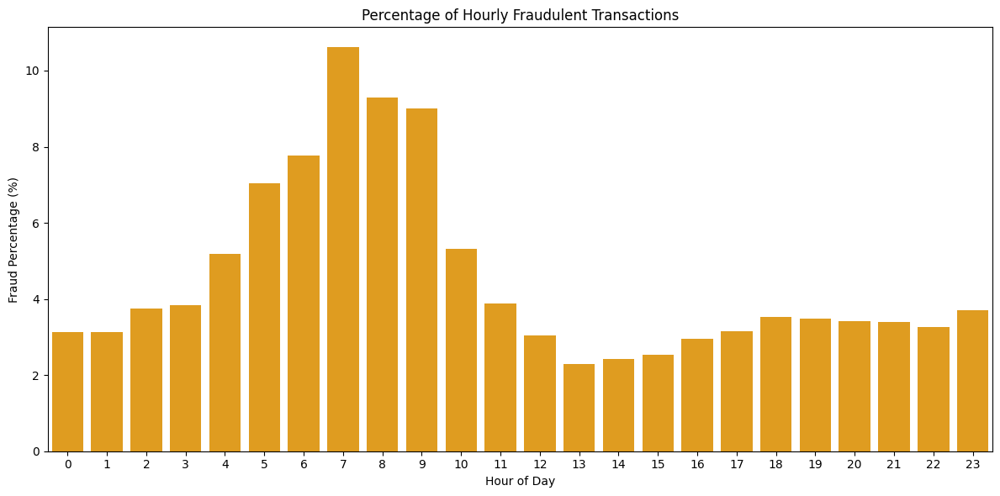

In [20]:
# Calculate percentage of fraudulent transactions per hour
hourly_fraud = tranz.groupby('Hour')['isFraud'].mean().reset_index()
hourly_fraud['Percentage'] = hourly_fraud['isFraud'] * 100

plt.figure(figsize=(12, 6))
sns.barplot(x='Hour', y='Percentage', data=hourly_fraud, color='orange')
plt.title('Percentage of Hourly Fraudulent Transactions')
plt.ylabel('Fraud Percentage (%)')
plt.xlabel('Hour of Day')
plt.tight_layout()
plt.show()

We make a frequency plot of both the test and train data. The two datasets are forward in time with roughly a month in between.

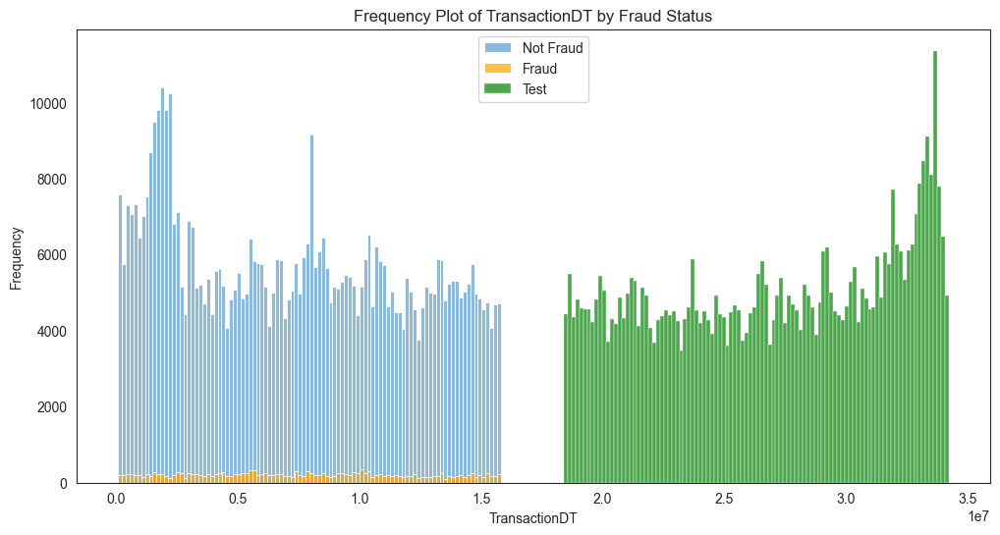

In [22]:
plt.figure(figsize=(12, 6))

sns.histplot(x=tranz[tranz['isFraud'] == 0]['TransactionDT'], bins=100, color='tab:blue', label='Not Fraud', alpha=0.5)
sns.histplot(x=tranz[tranz['isFraud'] == 1]['TransactionDT'], bins=100, color='orange', label='Fraud', alpha=0.7)
sns.histplot(x=tranz_test['TransactionDT'], bins=100, color='green', label='Test', alpha=0.7)
plt.title('Frequency Plot of TransactionDT by Fraud Status')
plt.xlabel('TransactionDT')
plt.ylabel('Frequency')
plt.legend()
plt.show()

We make a countplot of `ProductCD`

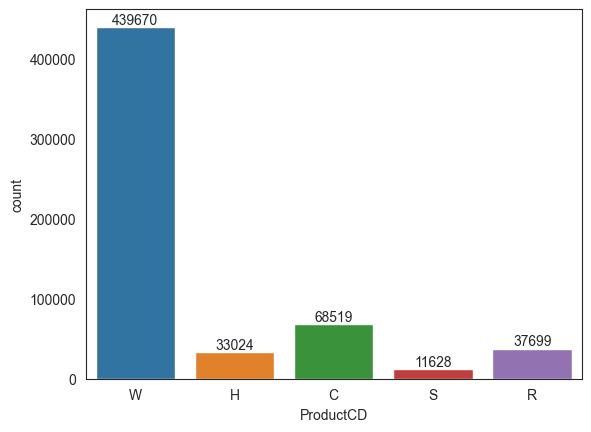

In [24]:
ax = sns.countplot(x='ProductCD', data=tranz, hue='ProductCD')

for container in ax.containers:
    ax.bar_label(container) # type: ignore

plt.show()

We look at `addr1` and `addr2`.

In [47]:
print(len(sorted(tranz['addr1'].unique())))

print(sorted(tranz['addr1'].unique()))

333
[100.0, 101.0, 122.0, 123.0, 126.0, 143.0, 158.0, 170.0, 177.0, 181.0, 184.0, 191.0, 204.0, 205.0, 220.0, 225.0, 226.0, 231.0, 251.0, 264.0, 269.0, 272.0, 299.0, 308.0, 310.0, 315.0, 325.0, 327.0, 330.0, 337.0, 343.0, 387.0, 420.0, 433.0, 436.0, 441.0, 469.0, 472.0, 476.0, nan, 102.0, 104.0, 105.0, 106.0, 110.0, 111.0, 112.0, 113.0, 117.0, 119.0, 120.0, 124.0, 125.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 137.0, 139.0, 141.0, 142.0, 144.0, 145.0, 146.0, 148.0, 151.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 159.0, 160.0, 161.0, 162.0, 163.0, 164.0, 166.0, 167.0, 168.0, 171.0, 172.0, 174.0, 178.0, 180.0, 182.0, 183.0, 185.0, 187.0, 189.0, 190.0, 193.0, 194.0, 195.0, 196.0, 198.0, 199.0, 200.0, 201.0, 202.0, 203.0, 206.0, 208.0, 210.0, 211.0, 213.0, 214.0, 215.0, 216.0, 217.0, 218.0, 219.0, 221.0, 223.0, 224.0, 227.0, 232.0, 233.0, 234.0, 235.0, 236.0, 237.0, 238.0, 239.0, 241.0, 242.0, 243.0, 244.0, 245.0, 247.0, 248.0, 249.0, 250.0, 252.0, 253.0, 254.0, 255.0, 257

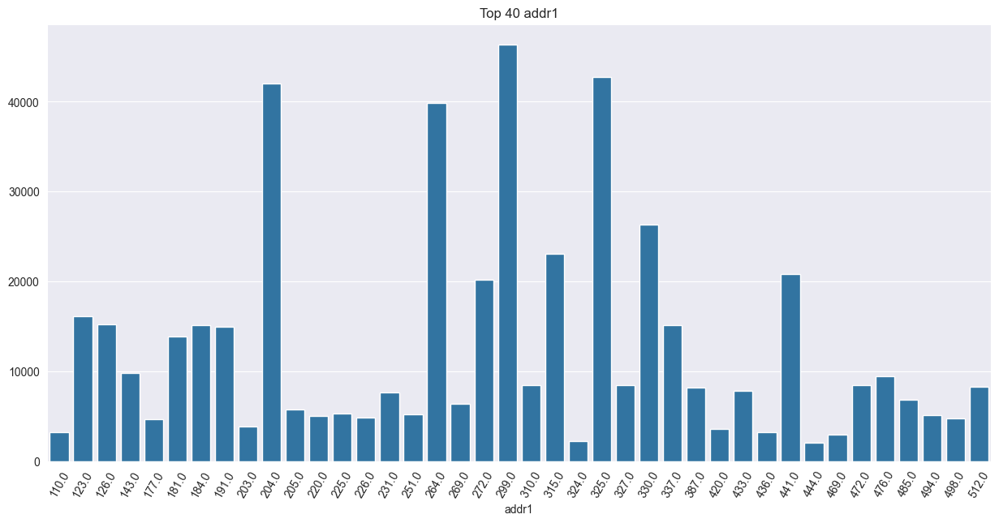

In [42]:
#Plot a Bar Chart
addr1_count = tranz['addr1'].value_counts().head(40)

plt.figure(figsize=(15, 7))
sns.set_style("darkgrid")

sns.barplot(x = addr1_count.index ,y = addr1_count.values)
plt.title('Top 40 addr1')
plt.xticks(rotation = 60)
plt.show()

In [40]:
print(len(sorted(tranz['addr2'].unique())))

print(sorted(tranz['addr2'].unique()))

75
[10.0, 87.0, nan, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 34.0, 35.0, 36.0, 38.0, 39.0, 40.0, 43.0, 44.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 54.0, 55.0, 57.0, 59.0, 60.0, 61.0, 62.0, 63.0, 65.0, 66.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 82.0, 83.0, 84.0, 86.0, 88.0, 89.0, 92.0, 93.0, 94.0, 96.0, 97.0, 98.0, 100.0, 101.0, 102.0]


<Axes: xlabel='addr2'>

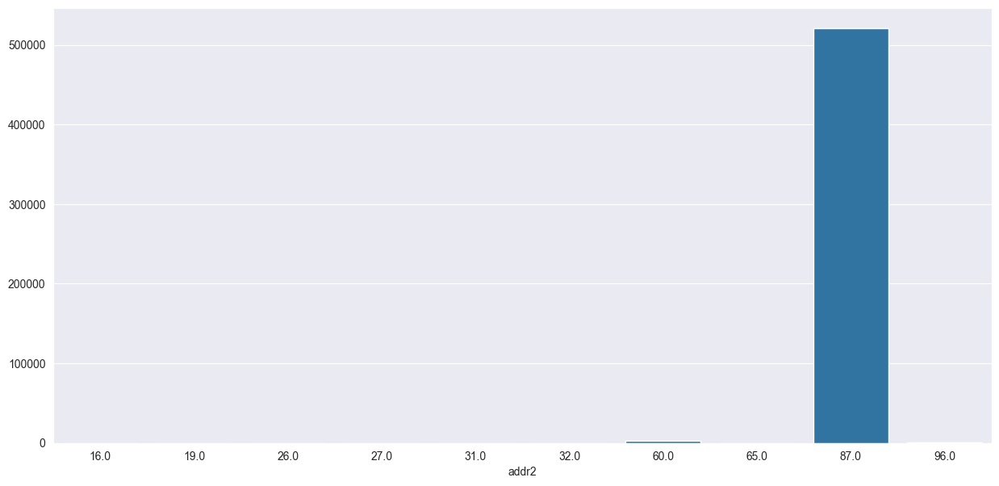

In [41]:
#Plot a Bar Chart
addr2_count = tranz['addr2'].value_counts().head(10)

plt.figure(figsize=(15, 7))
sns.set_style("darkgrid")

sns.barplot(x = addr2_count.index ,y = addr2_count.values)

We can interpret that `addr1` represents regions and `addr2` represents countries. \
Now we look at `P_emaildomain` where P stands for Purchaser.

In [48]:
tranz['P_emaildomain'].unique()

array([nan, 'gmail.com', 'outlook.com', 'yahoo.com', 'mail.com',
       'anonymous.com', 'hotmail.com', 'verizon.net', 'aol.com', 'me.com',
       'comcast.net', 'optonline.net', 'cox.net', 'charter.net',
       'rocketmail.com', 'prodigy.net.mx', 'embarqmail.com', 'icloud.com',
       'live.com.mx', 'gmail', 'live.com', 'att.net', 'juno.com',
       'ymail.com', 'sbcglobal.net', 'bellsouth.net', 'msn.com', 'q.com',
       'yahoo.com.mx', 'centurylink.net', 'servicios-ta.com',
       'earthlink.net', 'hotmail.es', 'cfl.rr.com', 'roadrunner.com',
       'netzero.net', 'gmx.de', 'suddenlink.net', 'frontiernet.net',
       'windstream.net', 'frontier.com', 'outlook.es', 'mac.com',
       'netzero.com', 'aim.com', 'web.de', 'twc.com', 'cableone.net',
       'yahoo.fr', 'yahoo.de', 'yahoo.es', 'sc.rr.com', 'ptd.net',
       'live.fr', 'yahoo.co.uk', 'hotmail.fr', 'hotmail.de',
       'hotmail.co.uk', 'protonmail.com', 'yahoo.co.jp'], dtype=object)

We make a dataframe to see if some email domains have more fraudulent transactions.

In [52]:
domnf = tranz[tranz['isFraud'] == 0]['P_emaildomain'].value_counts() 
domf = tranz[tranz['isFraud'] == 1]['P_emaildomain'].value_counts() 

# Create DataFrames from domnf and domf
domnf_df = domnf.reset_index(inplace = False)
domnf_df.columns = ['P_emaildomain', 'Non-Fraud Count']
domnf_df = domnf_df.sort_values(by='Non-Fraud Count')

domf_df = domf.reset_index(inplace = False)
domf_df.columns = ['P_emaildomain', 'Fraud Count']
domf_df = domf_df.sort_values(by='Fraud Count')

# Merge the two DataFrames on the P_emaildomain column
merged_df = pd.merge(domnf_df, domf_df, on='P_emaildomain', how='outer')

# Sort merged_df by descending order of 'Non-Fraud Count' and 'Fraud Count'
merged_df = merged_df.sort_values(by=['Non-Fraud Count', 'Fraud Count'], ascending=False).reset_index(drop = True)

# Display the resulting DataFrame
#merged_df

merged_df['Percentage'] = merged_df['Fraud Count']/(merged_df['Non-Fraud Count'] + merged_df['Fraud Count'])*100

merged_df['Percentage'] = merged_df['Fraud Count']/(merged_df['Non-Fraud Count'] + merged_df['Fraud Count'])*100

merged_df.sort_values(by = ['Percentage'], ascending = False).reset_index(drop = True).head(20)

,P_emaildomain,Non-Fraud Count,Fraud Count,Percentage
0,protonmail.com,45,31.0,40.789474
1,mail.com,453,106.0,18.962433
2,outlook.es,381,57.0,13.013699
3,aim.com,275,40.0,12.698413
4,outlook.com,4614,482.0,9.458399
5,hotmail.es,285,20.0,6.557377
6,live.com.mx,708,41.0,5.473965
7,hotmail.com,42854,2396.0,5.295028
8,gmail.com,218412,9943.0,4.354185
9,yahoo.fr,138,5.0,3.496503


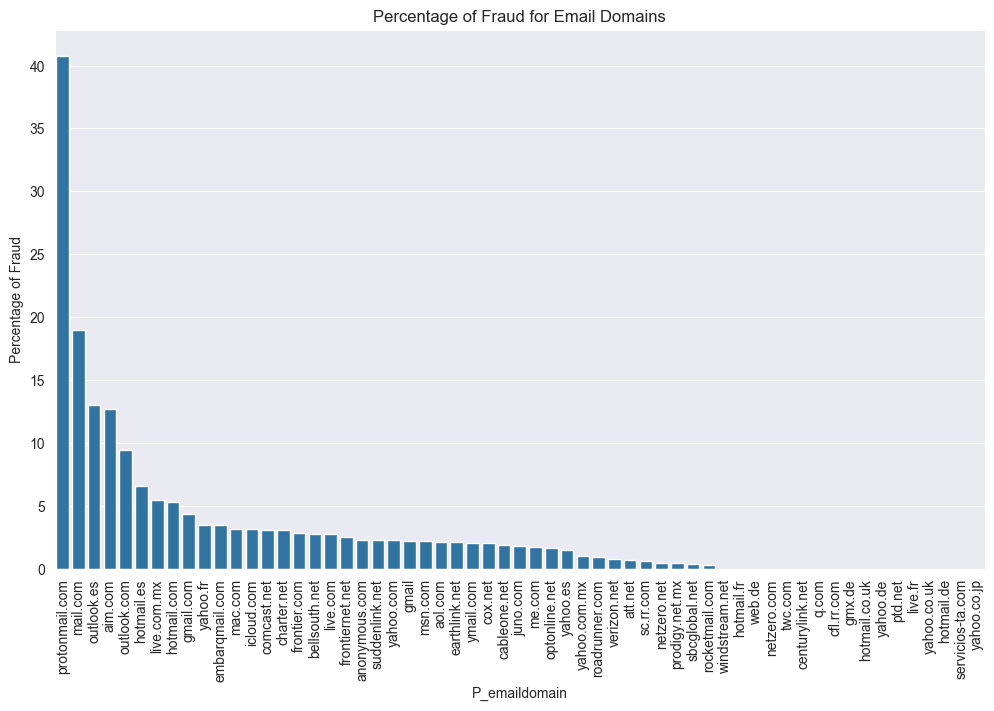

In [53]:
plt.figure(figsize = (12,7))

sns.barplot(data = merged_df.sort_values(by = ['Percentage'], ascending = False).reset_index(drop = True), x = 'P_emaildomain', y = 'Percentage')
plt.ylabel('Percentage of Fraud')
plt.title('Percentage of Fraud for Email Domains')
plt.xticks(rotation = 90)
plt.show()

Now, we define some functions to do some EDA in groups.

In [58]:
#A function to make histograms
def make_plots(cols_prefix,start,end):
    m_columns = [f'{cols_prefix}{i}' for i in range(start, end+1)]
    fig, axes = plt.subplots(nrows= len(m_columns)//3, ncols = 4, figsize=(18,12))
    
    axes = axes.flatten()
    for idx, colz in enumerate(m_columns):
        sns.histplot(x=tranz[colz].dropna(), bins=100, ax=axes[idx], kde=False)
        axes[idx].set_title(colz)
        axes[idx].set_xlabel('')
        axes[idx].set_ylabel('Count')
        axes[idx].tick_params(axis='x', rotation=90)


    plt.tight_layout()
    plt.show()

#A function to make scatterplots
def make_scplots(cols_prefix,start,end):

    d_columns = [f'{cols_prefix}{i}' for i in range(start, end+1)]
    fig, axes = plt.subplots(nrows= len(d_columns)//3, ncols=4, figsize=(18,12))

    axes = axes.flatten()

    for idx, colz in enumerate(d_columns):
        sns.scatterplot(data=tranz, x='TransactionDT', y=colz, ax=axes[idx])
        axes[idx].set_title(colz)


    plt.tight_layout()
    plt.show()

#A function which does EDA
def col_eda(col_prefix, start, end):
	cols = tranz[[f'{col_prefix}{i}' for i in range(start, end+1)]].copy()

	# Find the number of missing values in each column
	miss_val_cols = cols.isnull().sum()
	miss_val_per_cols = (miss_val_cols / len(cols)) * 100
	miss_data_cols = pd.DataFrame({'Missing Values': miss_val_cols, 'Percentage (%)': miss_val_per_cols})

	print(miss_data_cols.sort_values(by='Percentage (%)', ascending=True))
	print('\n')
	print('Columns 50 percent of whose data is not nan :')
	print(miss_data_cols[miss_data_cols['Percentage (%)'] < 50].index.tolist())


	# Fill missing values before converting to int
	cols = cols.fillna(-999)


	for col in cols.columns:
		if cols[col].dtype == 'object':
			cols[col] = pd.factorize(cols[col])[0]
		else:
			cols[col] = cols[col].astype(int)


	corr_matrix = cols.corr()

	plt.figure(figsize=(10, 10))
	sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
	plt.title(f"Correlation Heatmap for {col_prefix}")
	plt.show()

	cols_name = cols.columns.tolist()

	make_plots(f'{col_prefix}',start,end)

	make_scplots(f'{col_prefix}',start,end)

	return

We observe the C, D and M columns.

     Missing Values  Percentage (%)
C1                0             0.0
C2                0             0.0
C3                0             0.0
C4                0             0.0
C5                0             0.0
C6                0             0.0
C7                0             0.0
C8                0             0.0
C9                0             0.0
C10               0             0.0
C11               0             0.0
C12               0             0.0
C13               0             0.0
C14               0             0.0


Columns 50 percent of whose data is not nan :
['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14']


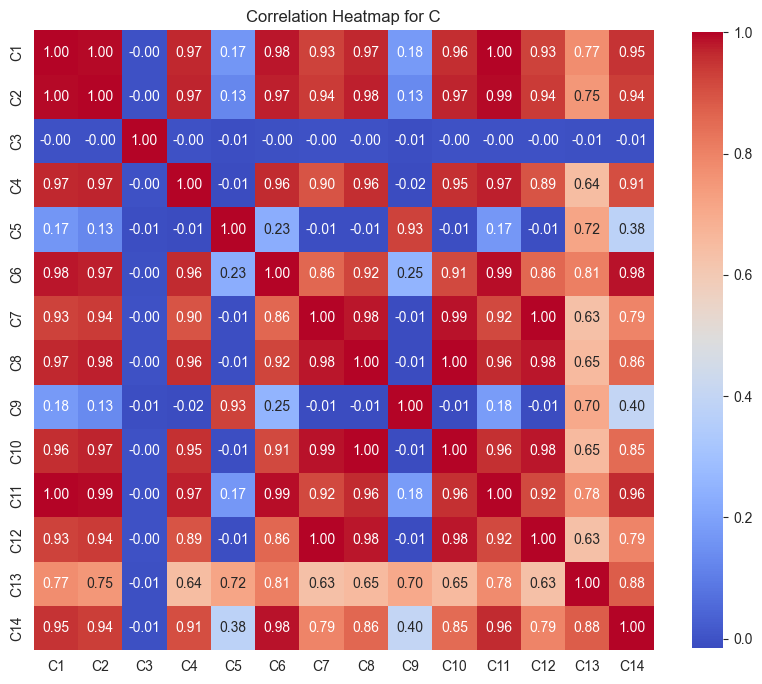

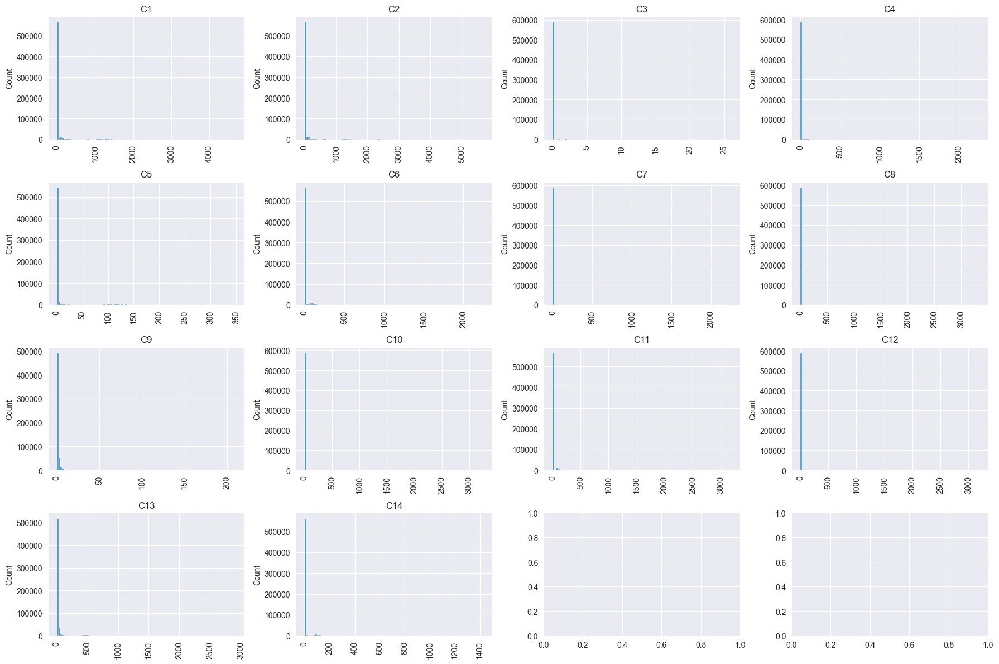

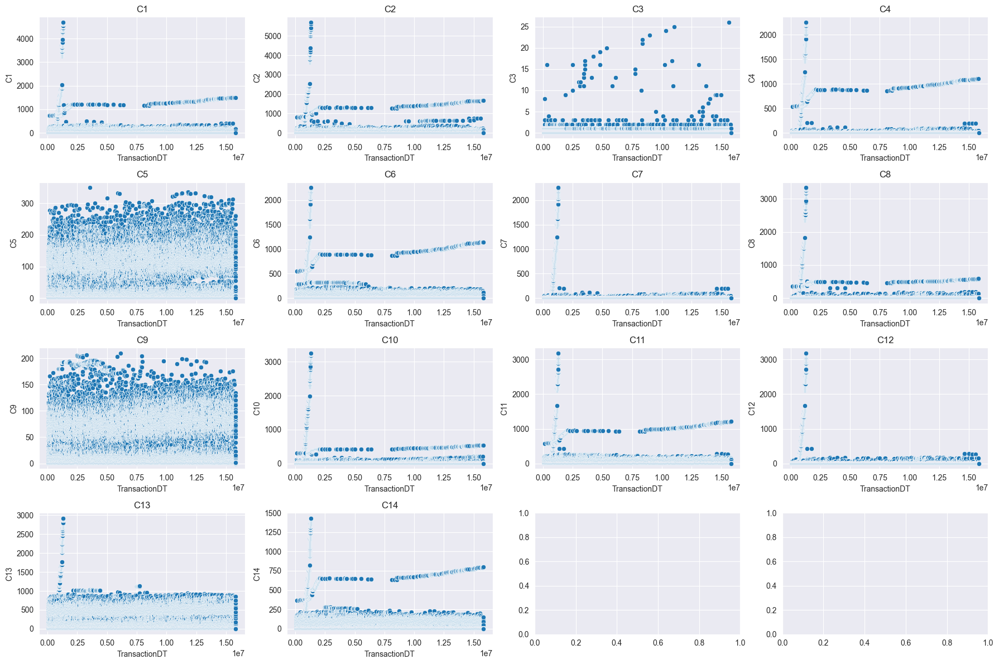

In [59]:
col_eda('C',1,14)

     Missing Values  Percentage (%)
D1             1269        0.214888
D10           76022       12.873302
D15           89113       15.090087
D4           168922       28.604667
D3           262878       44.514851
D11          279287       47.293494
D2           280797       47.549192
D5           309841       52.467403
D8           515614       87.312290
D9           515614       87.312290
D6           517353       87.606767
D12          525823       89.041047
D14          528353       89.469469
D13          528588       89.509263
D7           551623       93.409930


Columns 50 percent of whose data is not nan :
['D1', 'D2', 'D3', 'D4', 'D10', 'D11', 'D15']


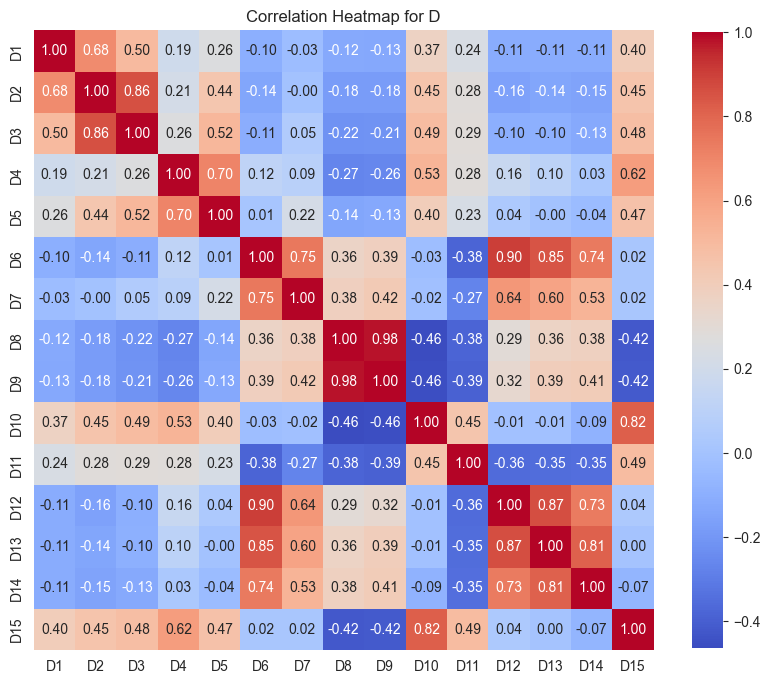

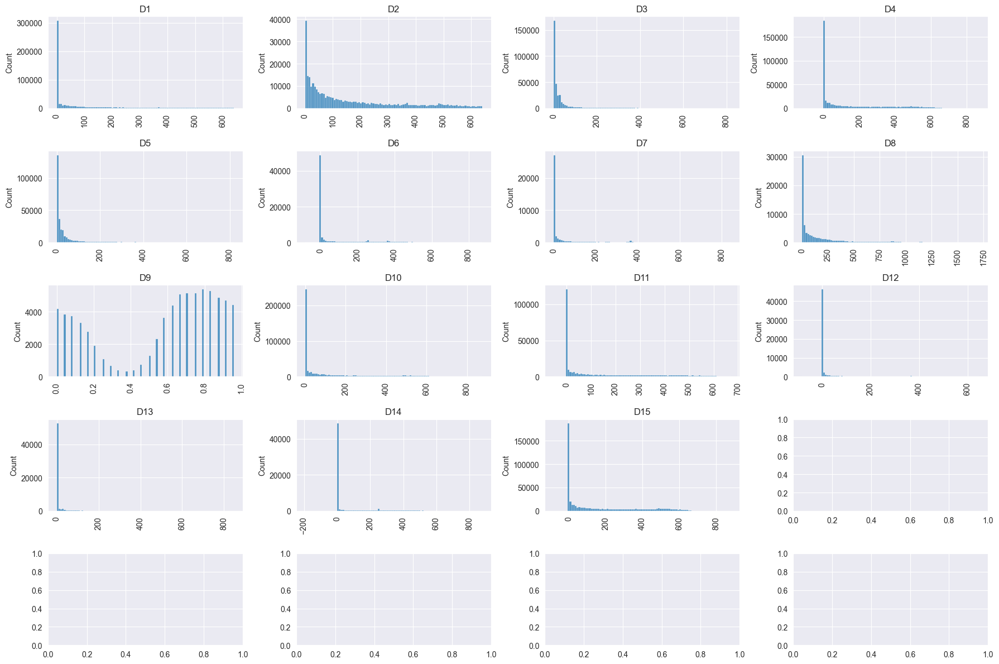

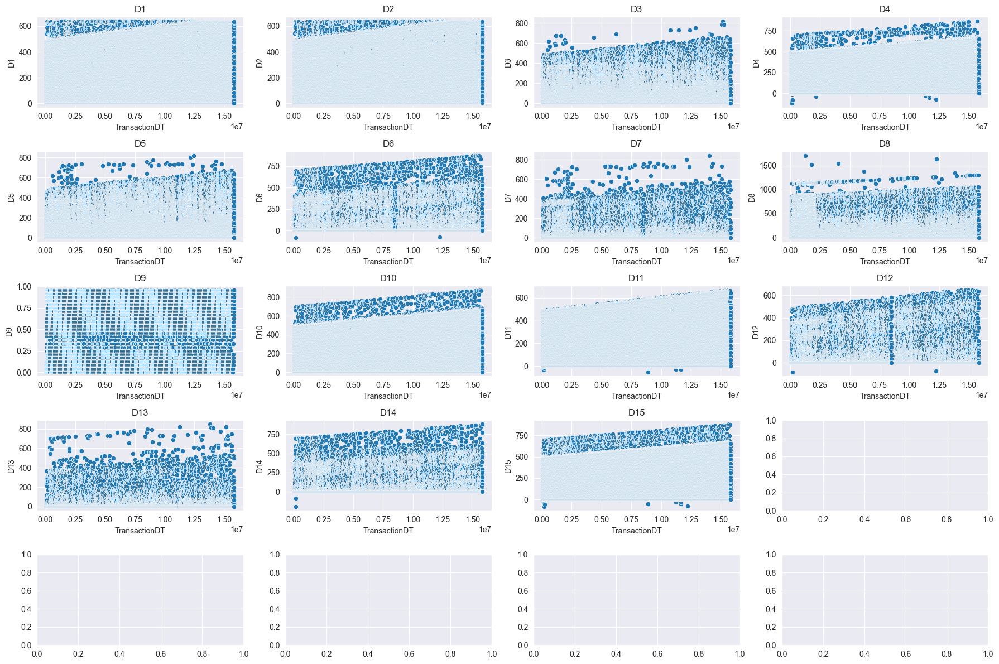

In [60]:
col_eda('D',1,15)

The D Columns are "time deltas" from some point in the past. We will transform the D Columns into their point in the past. This will stop the D columns from increasing with time. The formula is `D1n = Transaction_Day - D1` and `Transaction_Day = TransactionDT/(24*60*60)`. Afterward we multiple this number by negative one.

In [62]:
# NORMALIZE D COLUMNS
for i in range(1,16):
    tranz['D'+str(i)] =  tranz['D'+str(i)] - tranz.TransactionDT/(24*60*60) 

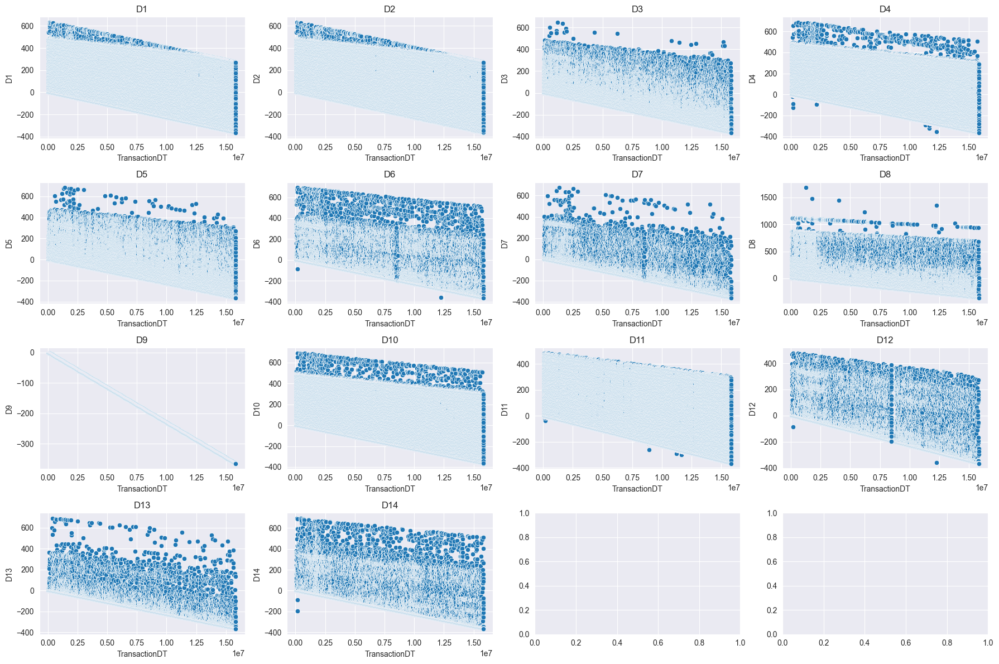

In [63]:
make_scplots('D',1,14)

    Missing Values  Percentage (%)
M6          169360       28.678836
M1          271100       45.907136
M2          271100       45.907136
M3          271100       45.907136
M4          281444       47.658753
M8          346252       58.633115
M9          346252       58.633115
M7          346265       58.635317
M5          350482       59.349409


Columns 50 percent of whose data is not nan :
['M1', 'M2', 'M3', 'M4', 'M6']


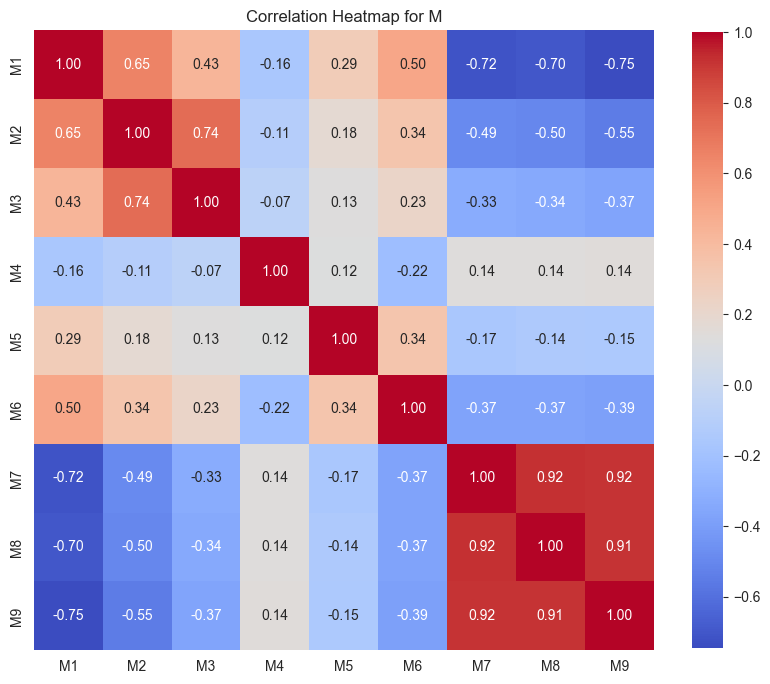

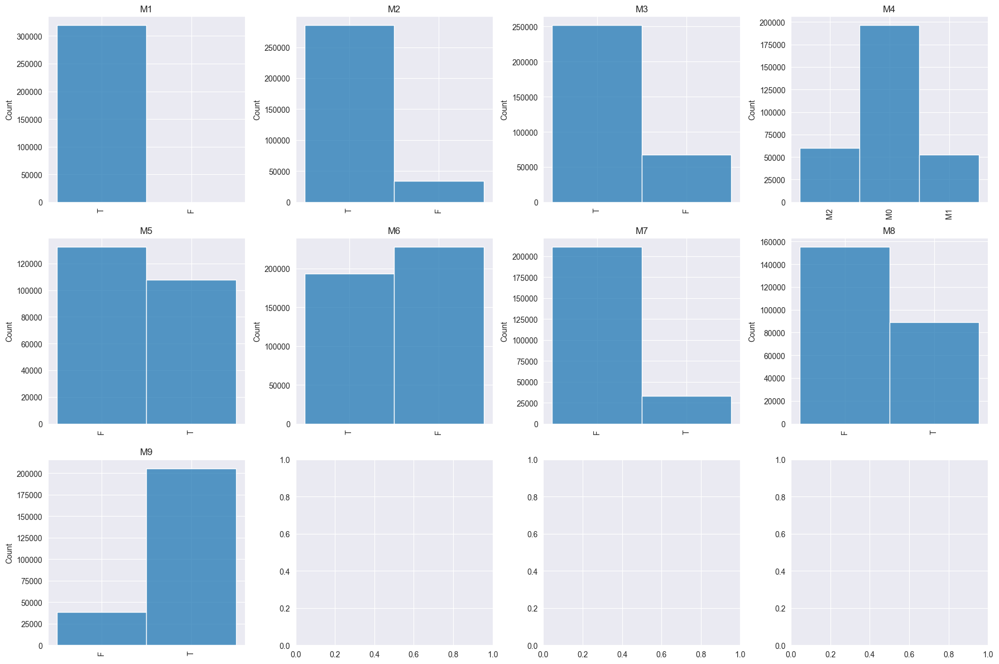

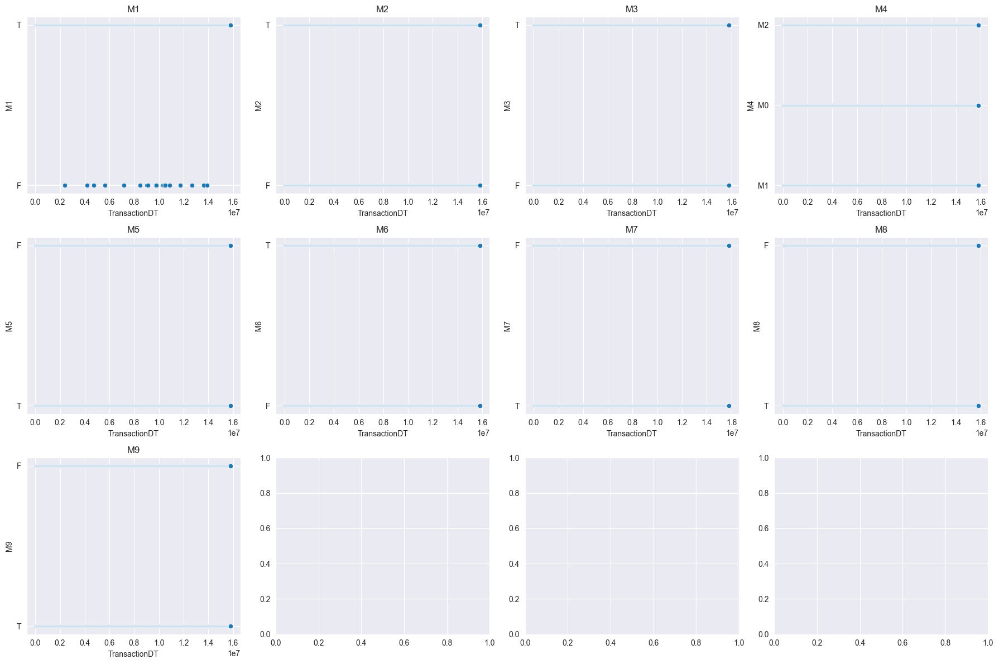

In [64]:
col_eda('M',1,9)

Moving on to the 339 V columns. We can divided them in groups based on the number of `Nans` the have. And then use correlation to reduce their number.

In [66]:
tranz_nan = tranz.isna().sum().reset_index()
tranz_nan.columns = ['col','nans']

tranz_nan_grp = tranz_nan.groupby('nans')['col'].apply(list).reset_index()
tranz_nan_grp['number of cols'] = tranz_nan_grp['col'].apply(len)

tranz_nan_grp

,nans,col,number of cols
0,0,"[TransactionID, isFraud, TransactionDT, Transa...",23
1,12,"[V279, V280, V284, V285, V286, V287, V290, V29...",32
2,314,"[V95, V96, V97, V98, V99, V100, V101, V102, V1...",43
3,1269,"[D1, V281, V282, V283, V288, V289, V296, V300,...",12
4,1565,[card3],1
...,...,...,...
65,585377,[id_26],1
66,585381,[id_21],1
67,585385,"[id_07, id_08]",2
68,585408,[id_25],1


In [67]:
tranz_nan_v = tranz_nan_grp[tranz_nan_grp['col'].apply(lambda cols: any(str(col).startswith('V') for col in cols))].reset_index(drop=True)

for idx, cols in enumerate(tranz_nan_v['col']):
    print(f'Group {idx+1} = {cols}')

Group 1 = ['V279', 'V280', 'V284', 'V285', 'V286', 'V287', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V297', 'V298', 'V299', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321']
Group 2 = ['V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137']
Group 3 = ['D1', 'V281', 'V282', 'V283', 'V288', 'V289', 'V296', 'V300', 'V301', 'V313', 'V314', 'V315']
Group 4 = ['V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34']
Group 5 = ['V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66

We make a function which make correlation heatmaps and reduces the number of V columns by only keeping on feature from a group of highly correlated features.

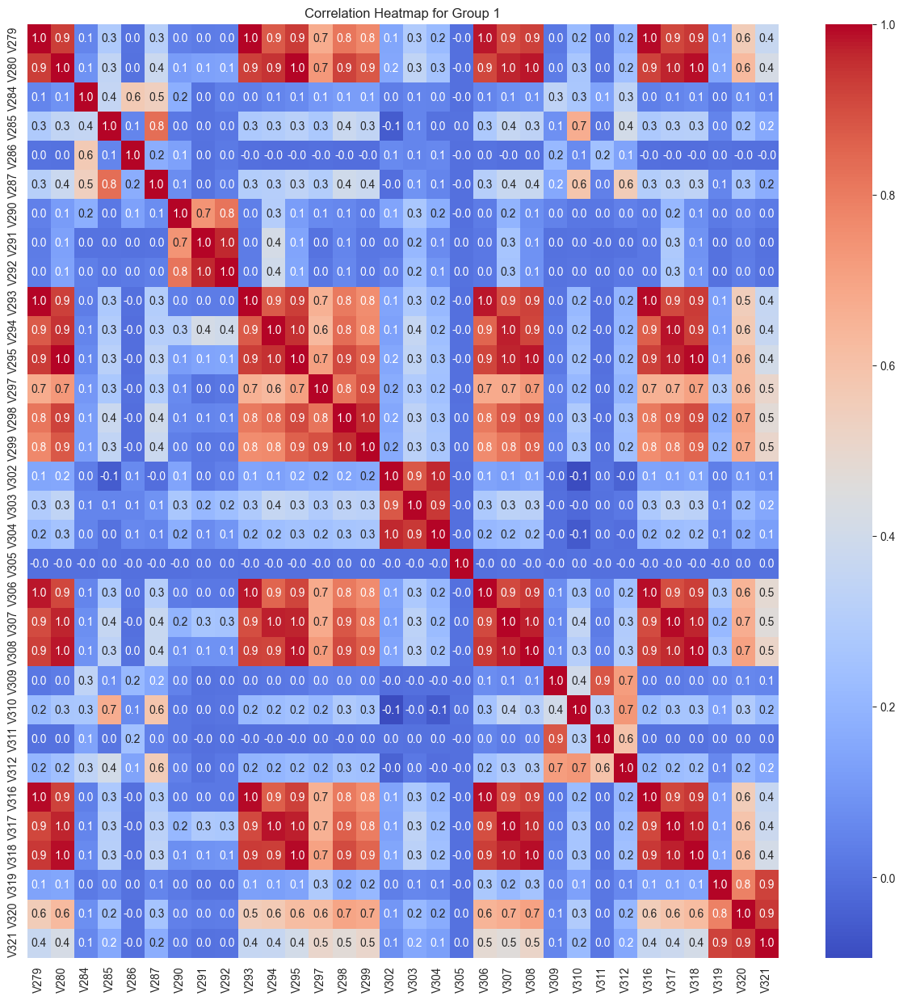

cols = ['V279', 'V280', 'V284', 'V285', 'V286', 'V287', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V297', 'V298', 'V299', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321']
reduced cols =  ['V279', 'V284', 'V285', 'V286', 'V290', 'V302', 'V305', 'V309', 'V310', 'V319']


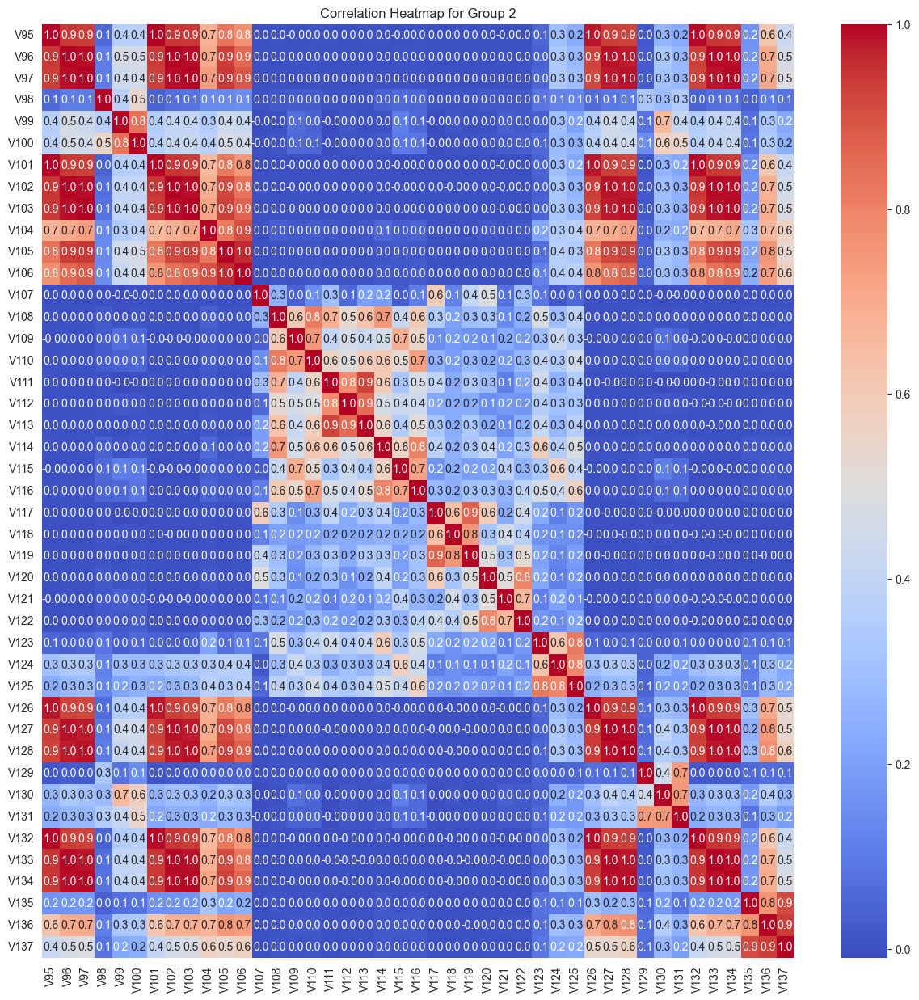

cols = ['V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137']
reduced cols =  ['V95', 'V98', 'V99', 'V107', 'V108', 'V109', 'V111', 'V115', 'V117', 'V118', 'V120', 'V121', 'V123', 'V124', 'V129', 'V130', 'V135']


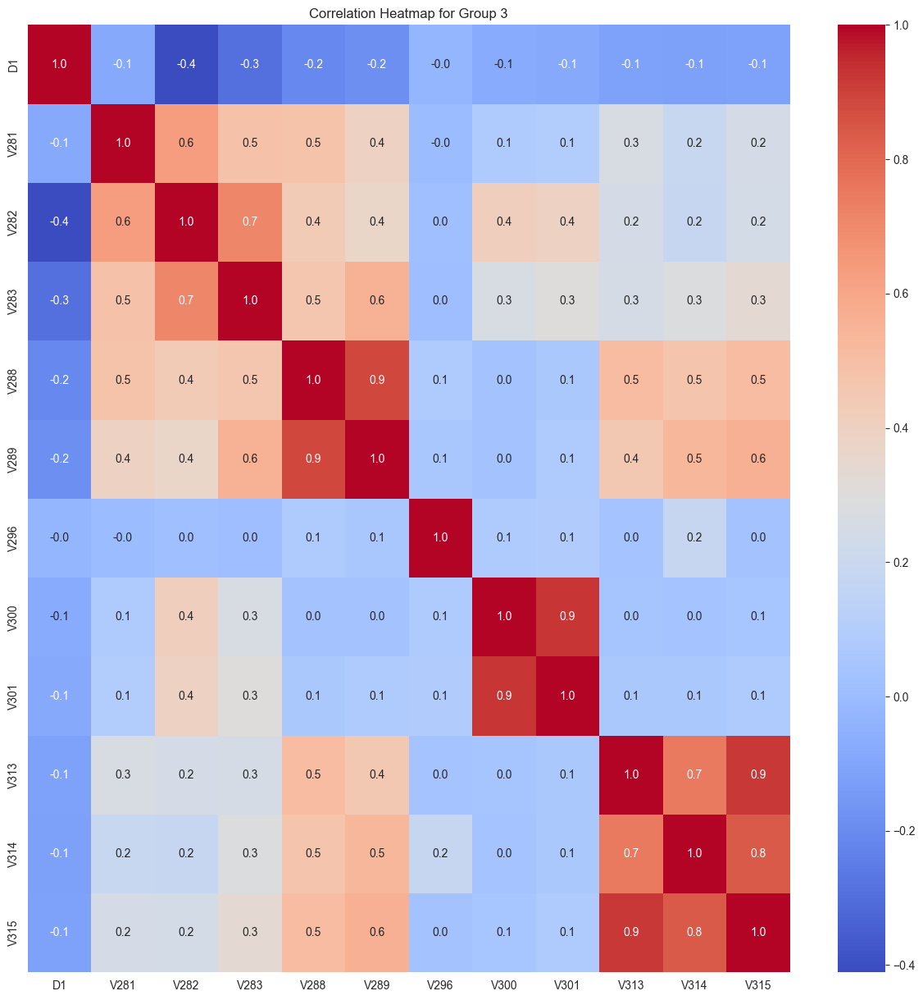

cols = ['D1', 'V281', 'V282', 'V283', 'V288', 'V289', 'V296', 'V300', 'V301', 'V313', 'V314', 'V315']
reduced cols =  ['D1', 'V281', 'V282', 'V288', 'V296', 'V300', 'V313']


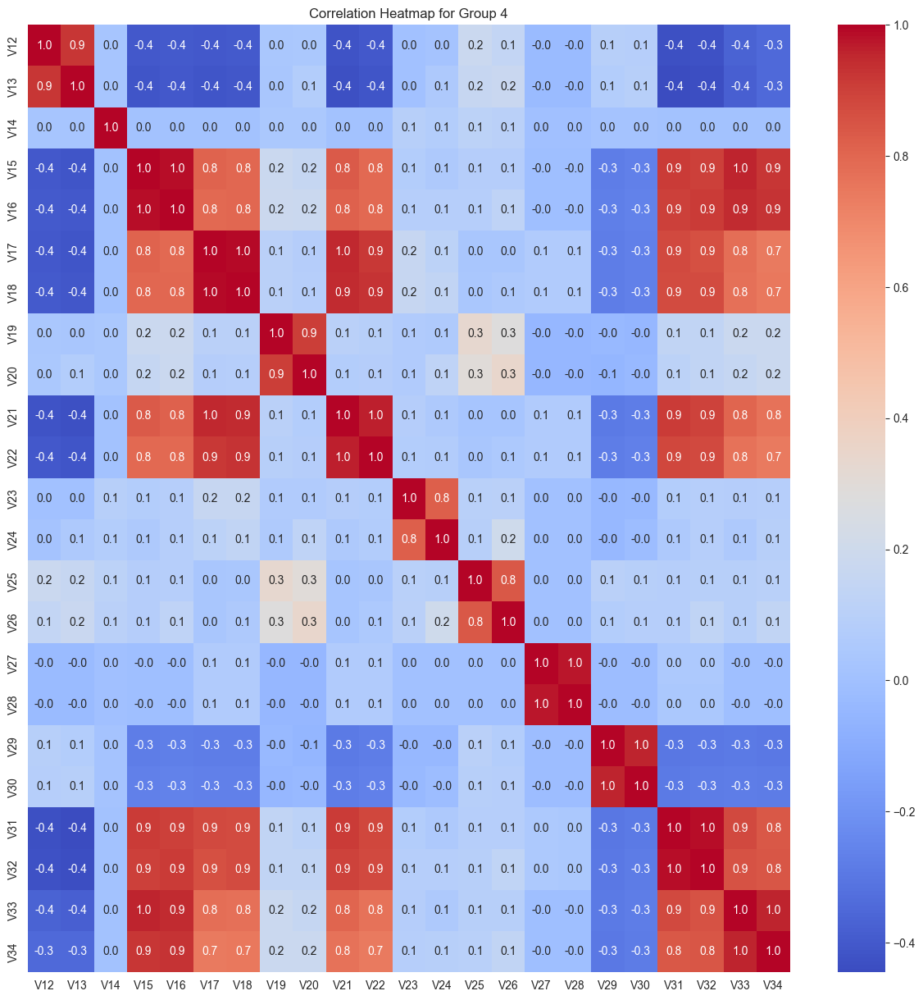

cols = ['V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34']
reduced cols =  ['V12', 'V14', 'V15', 'V19', 'V23', 'V25', 'V27', 'V29']


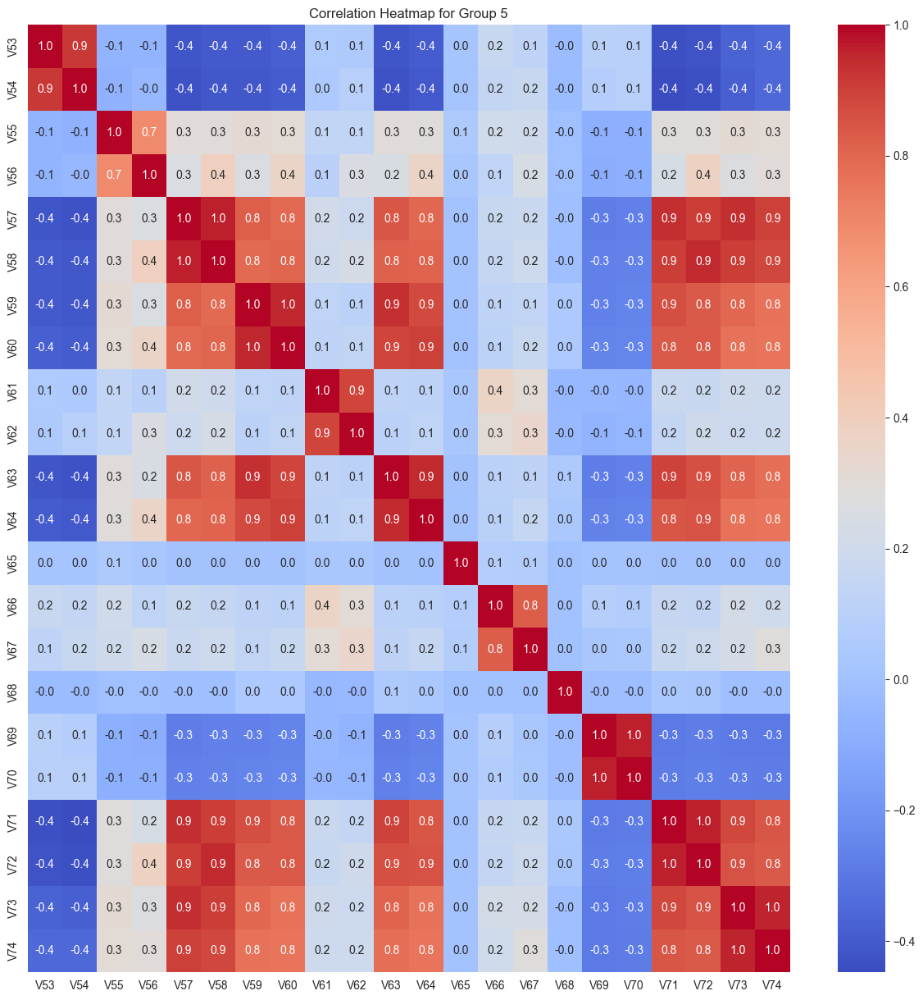

cols = ['V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74']
reduced cols =  ['V53', 'V55', 'V56', 'V57', 'V61', 'V65', 'V66', 'V68', 'V69']


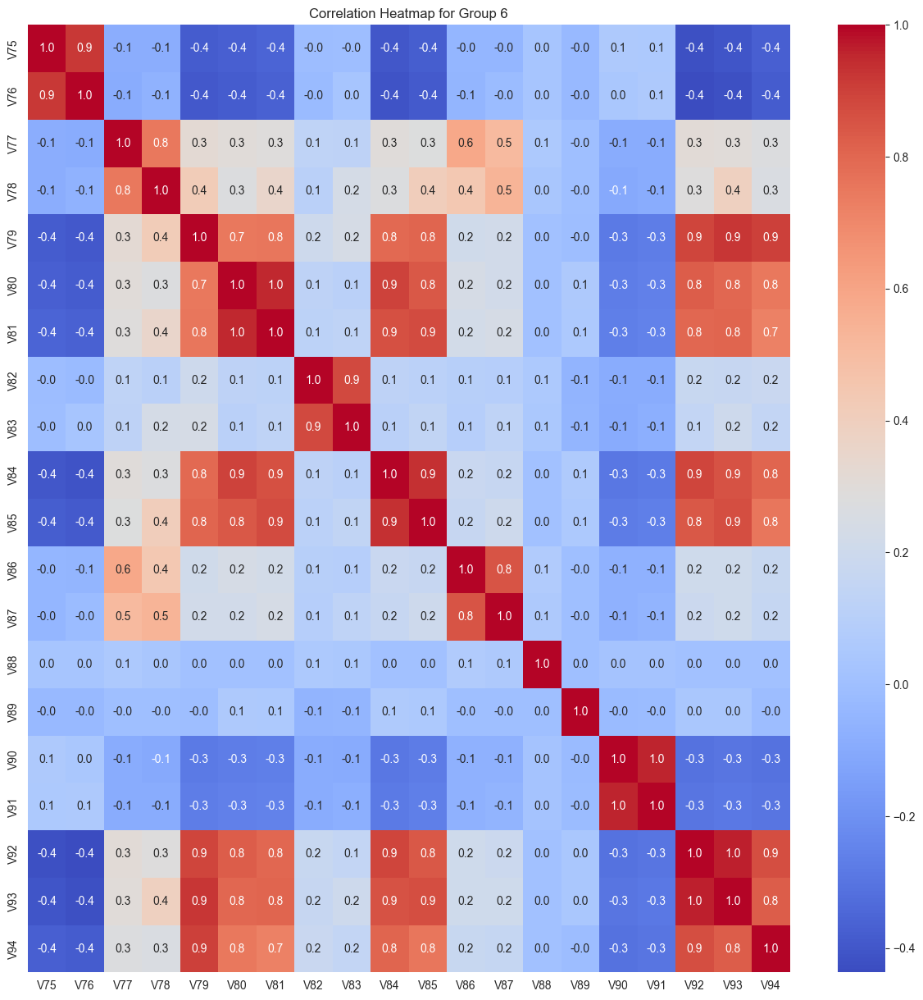

cols = ['V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94']
reduced cols =  ['V75', 'V77', 'V79', 'V82', 'V86', 'V88', 'V89', 'V90']


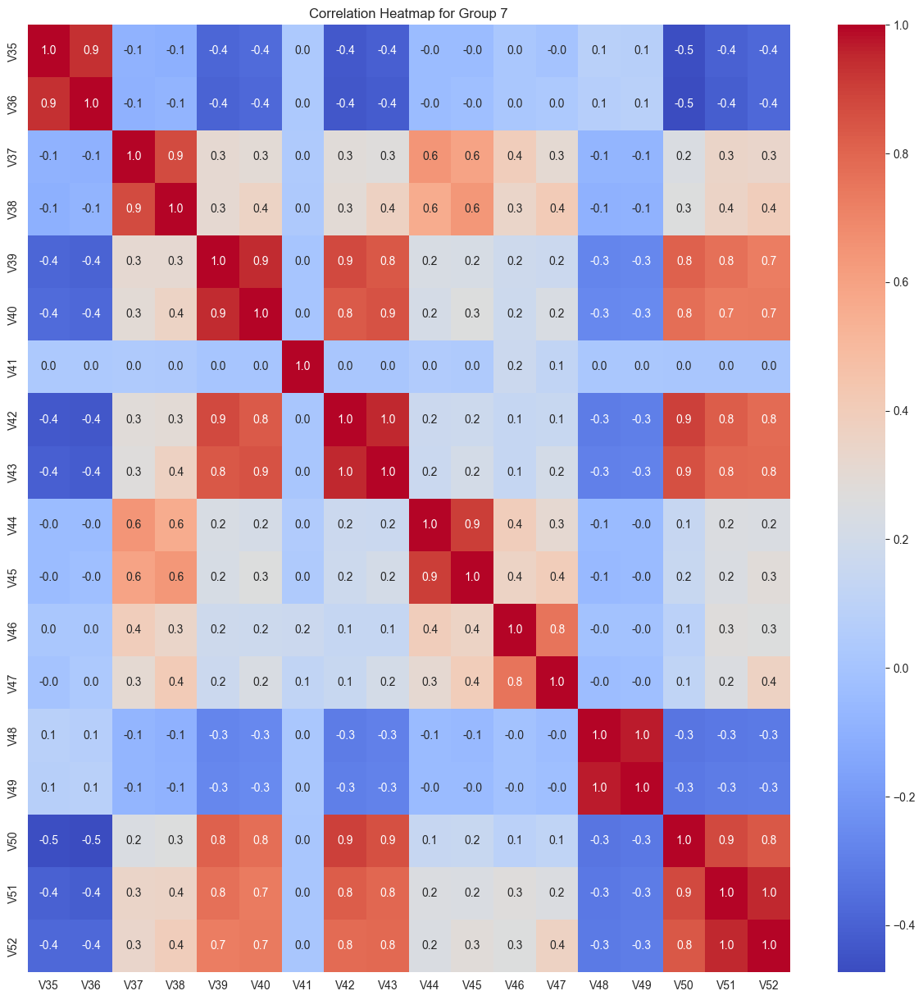

cols = ['V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52']
reduced cols =  ['V35', 'V37', 'V39', 'V41', 'V44', 'V46', 'V48']


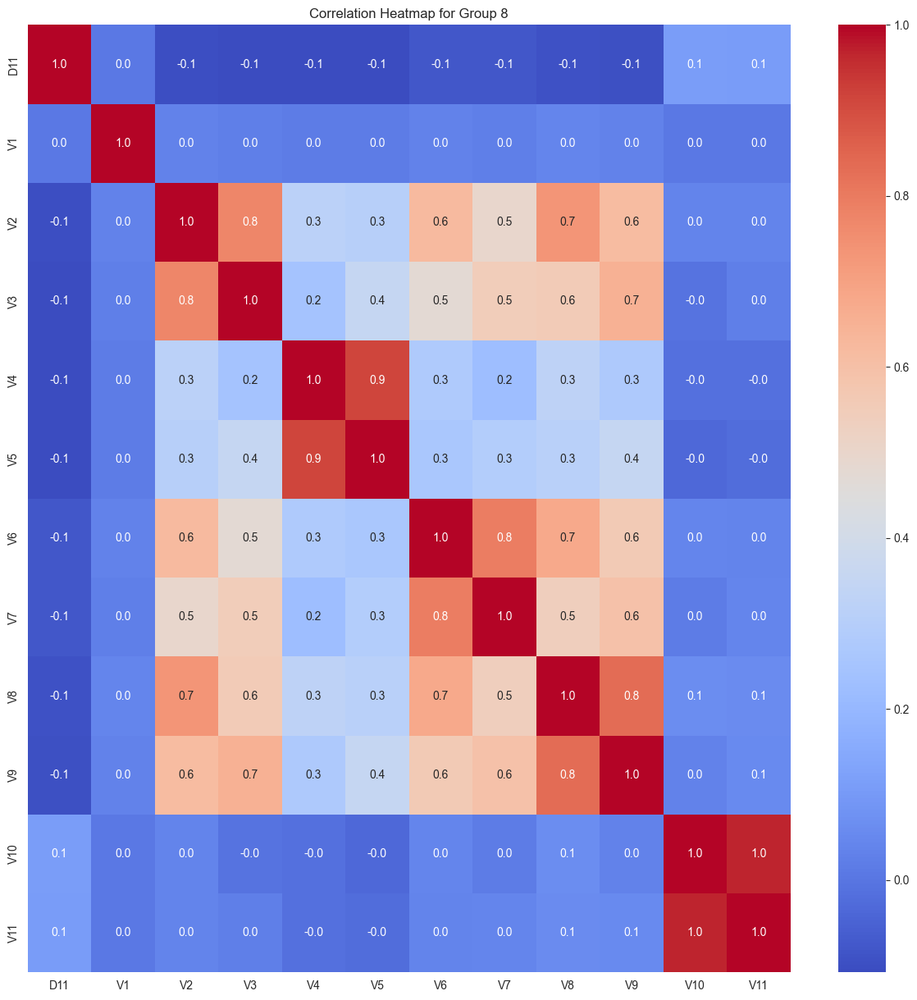

cols = ['D11', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11']
reduced cols =  ['D11', 'V1', 'V2', 'V4', 'V6', 'V10']


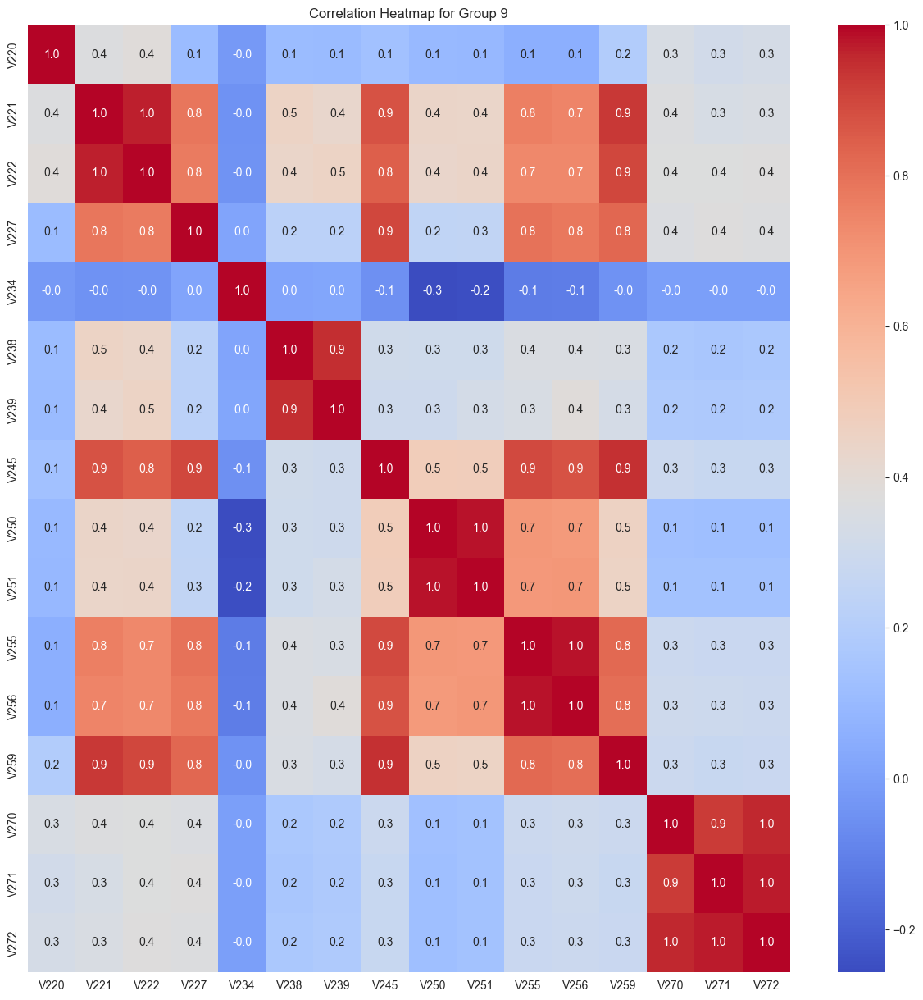

cols = ['V220', 'V221', 'V222', 'V227', 'V234', 'V238', 'V239', 'V245', 'V250', 'V251', 'V255', 'V256', 'V259', 'V270', 'V271', 'V272']
reduced cols =  ['V220', 'V221', 'V234', 'V238', 'V250', 'V270']


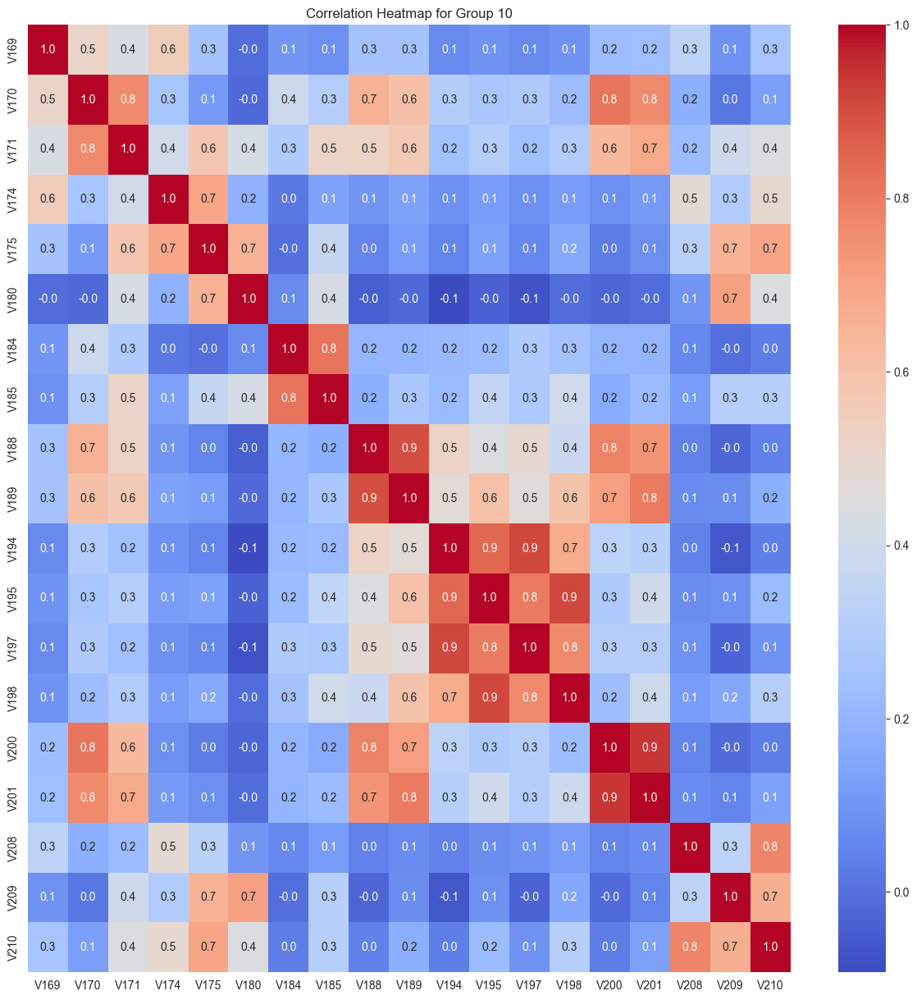

cols = ['V169', 'V170', 'V171', 'V174', 'V175', 'V180', 'V184', 'V185', 'V188', 'V189', 'V194', 'V195', 'V197', 'V198', 'V200', 'V201', 'V208', 'V209', 'V210']
reduced cols =  ['V169', 'V170', 'V174', 'V175', 'V180', 'V184', 'V188', 'V194', 'V208']


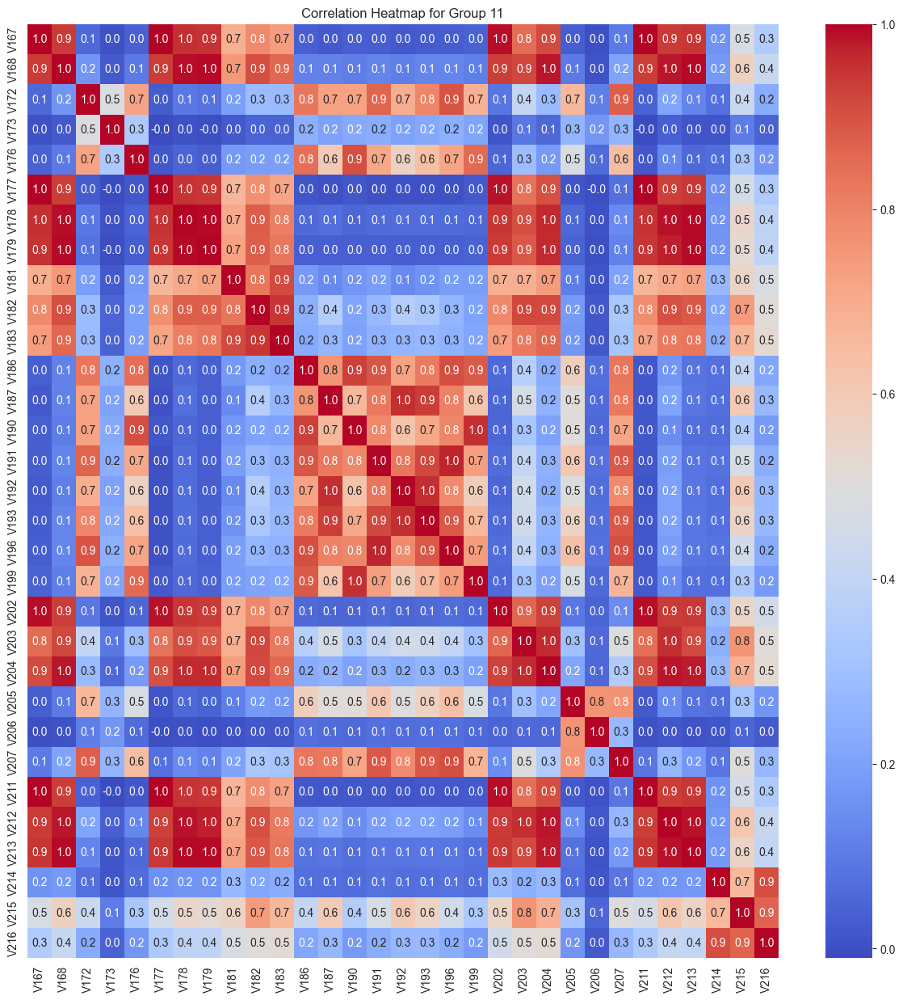

cols = ['V167', 'V168', 'V172', 'V173', 'V176', 'V177', 'V178', 'V179', 'V181', 'V182', 'V183', 'V186', 'V187', 'V190', 'V191', 'V192', 'V193', 'V196', 'V199', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216']
reduced cols =  ['V167', 'V172', 'V173', 'V205', 'V214']


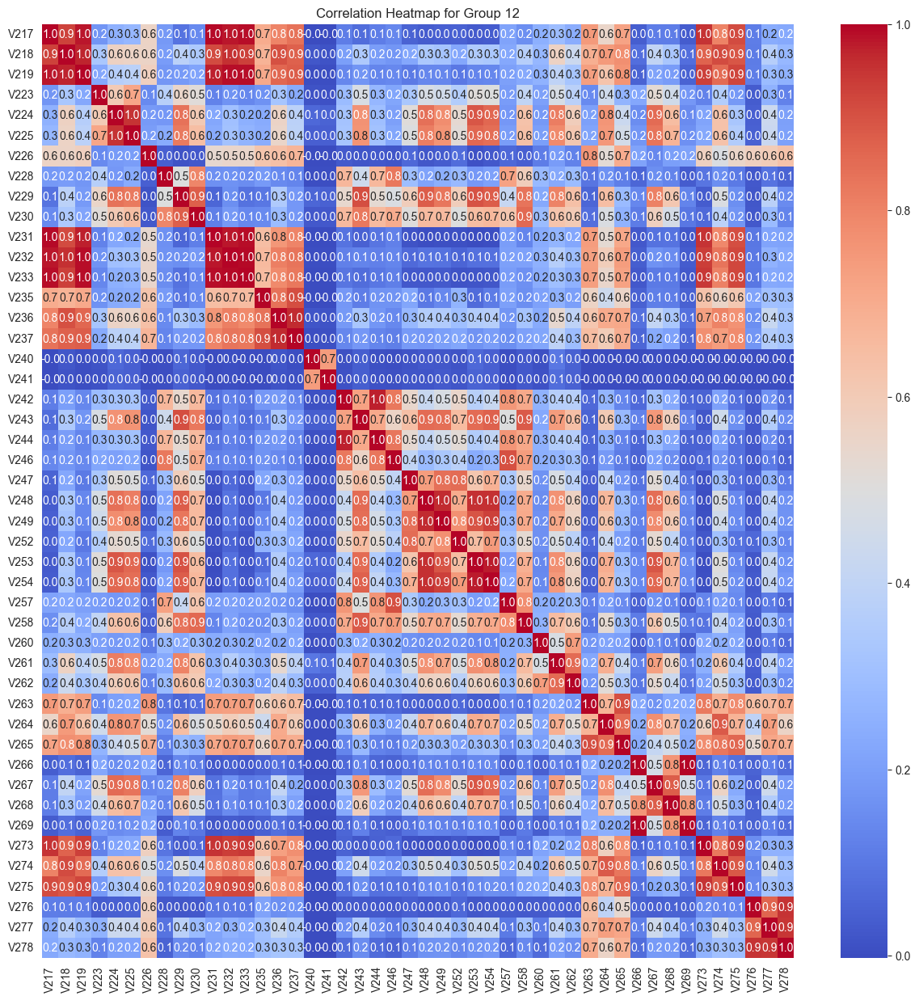

cols = ['V217', 'V218', 'V219', 'V223', 'V224', 'V225', 'V226', 'V228', 'V229', 'V230', 'V231', 'V232', 'V233', 'V235', 'V236', 'V237', 'V240', 'V241', 'V242', 'V243', 'V244', 'V246', 'V247', 'V248', 'V249', 'V252', 'V253', 'V254', 'V257', 'V258', 'V260', 'V261', 'V262', 'V263', 'V264', 'V265', 'V266', 'V267', 'V268', 'V269', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278']
reduced cols =  ['V217', 'V223', 'V224', 'V226', 'V228', 'V240', 'V242', 'V247', 'V260', 'V266', 'V276']


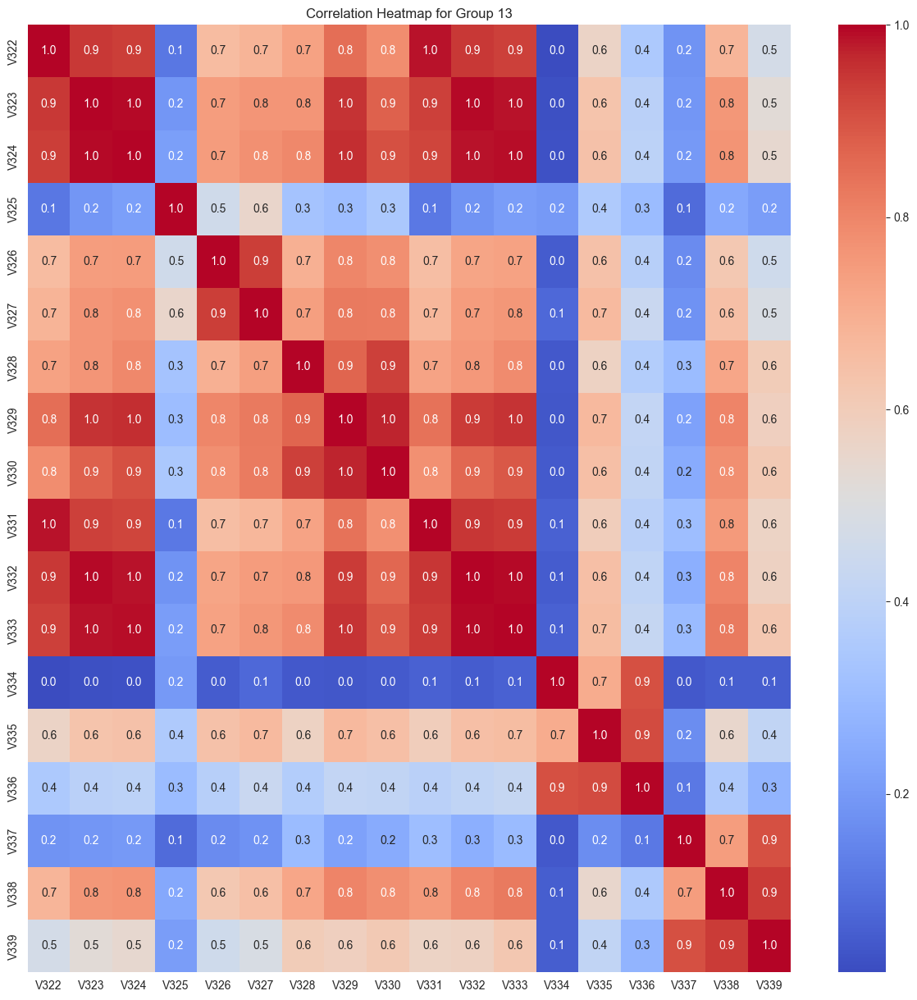

cols = ['V322', 'V323', 'V324', 'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339']
reduced cols =  ['V322', 'V325', 'V334', 'V337']


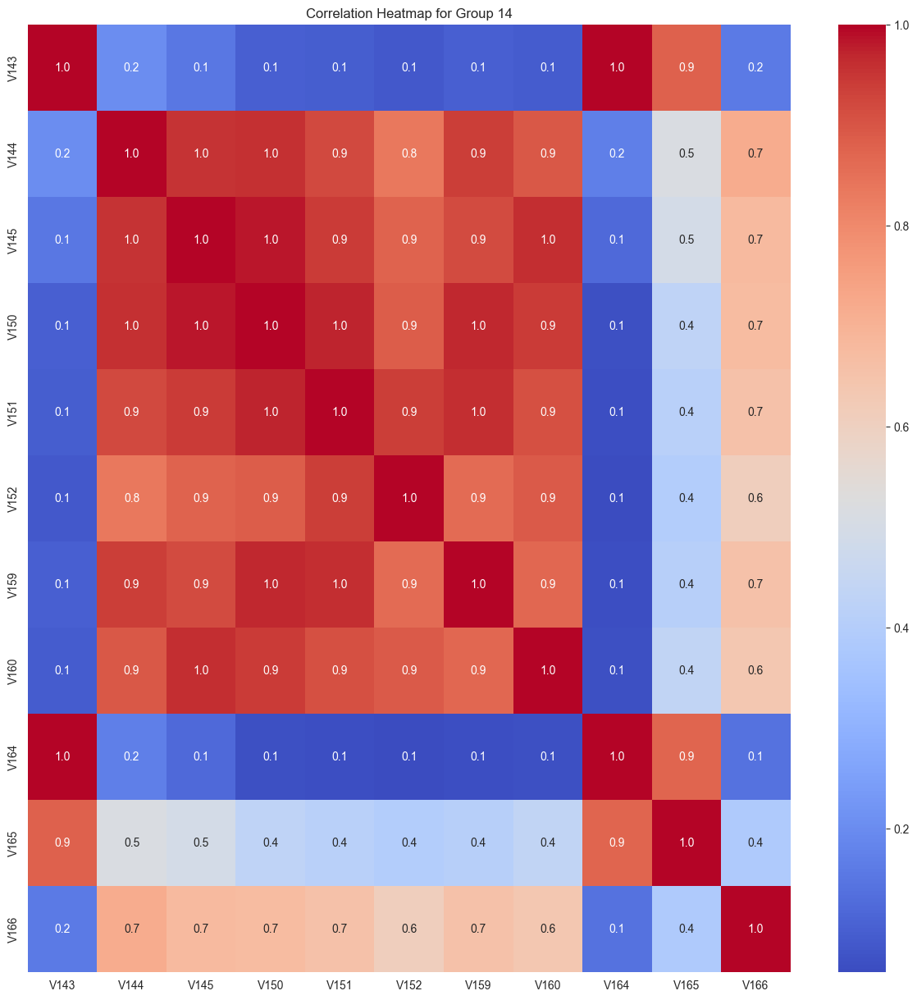

cols = ['V143', 'V144', 'V145', 'V150', 'V151', 'V152', 'V159', 'V160', 'V164', 'V165', 'V166']
reduced cols =  ['V143', 'V144']


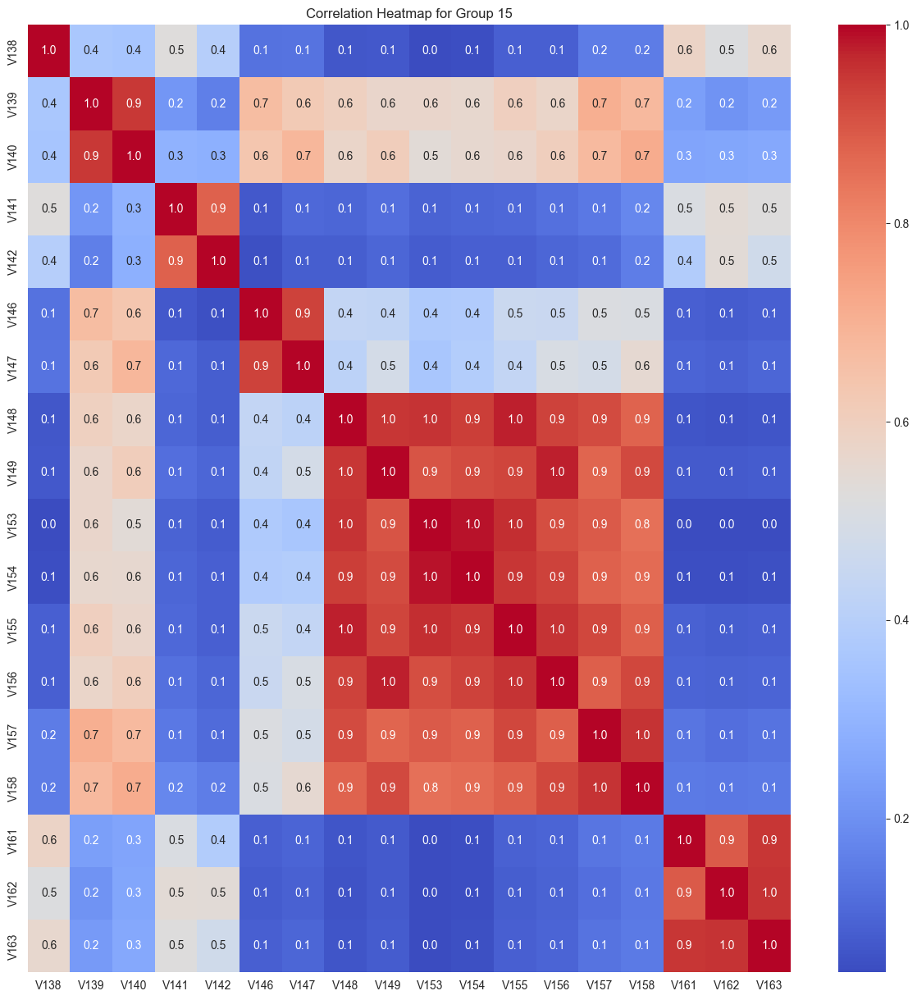

cols = ['V138', 'V139', 'V140', 'V141', 'V142', 'V146', 'V147', 'V148', 'V149', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V161', 'V162', 'V163']
reduced cols =  ['V138', 'V139', 'V141', 'V146', 'V148', 'V161']
All V columns after reduction:
 ['V279', 'V284', 'V285', 'V286', 'V290', 'V302', 'V305', 'V309', 'V310', 'V319', 'V95', 'V98', 'V99', 'V107', 'V108', 'V109', 'V111', 'V115', 'V117', 'V118', 'V120', 'V121', 'V123', 'V124', 'V129', 'V130', 'V135', 'D1', 'V281', 'V282', 'V288', 'V296', 'V300', 'V313', 'V12', 'V14', 'V15', 'V19', 'V23', 'V25', 'V27', 'V29', 'V53', 'V55', 'V56', 'V57', 'V61', 'V65', 'V66', 'V68', 'V69', 'V75', 'V77', 'V79', 'V82', 'V86', 'V88', 'V89', 'V90', 'V35', 'V37', 'V39', 'V41', 'V44', 'V46', 'V48', 'D11', 'V1', 'V2', 'V4', 'V6', 'V10', 'V220', 'V221', 'V234', 'V238', 'V250', 'V270', 'V169', 'V170', 'V174', 'V175', 'V180', 'V184', 'V188', 'V194', 'V208', 'V167', 'V172', 'V173', 'V205', 'V214', 'V217', 'V223', 'V224', 'V226', 'V228', 'V240', 'V242', 'V247

In [70]:
v_red_col = []

for idx, cols in enumerate(tranz_nan_v['col']):
    df = tranz[cols]
    corr = df.corr()
    plt.figure(figsize=(15, 15))
    
    sns.heatmap(corr, annot=True, fmt='.1f', cmap='coolwarm')
    plt.title(f'Correlation Heatmap for Group {idx+1}')
    plt.show()

    corr_matrix = df.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] >= 0.7)]

    red_col = [col for col in cols if col not in to_drop]
    

    v_red_col.extend(red_col)

    print(f'cols = {cols}')
    print('reduced cols = ',red_col)

print('All V columns after reduction:\n',v_red_col)

In [ ]:
#Sorts and combines all the groups
v_red_col_sorted = sorted(v_red_col, key=lambda x: int(''.join(filter(str.isdigit, x))))

v_red_col_sorted_v = [col for col in v_red_col_sorted if col.startswith('V')]
len(v_red_col_sorted_v)

We look the correlation heatmap of all reduced V features and find 3 blocks of V features which are correlated.

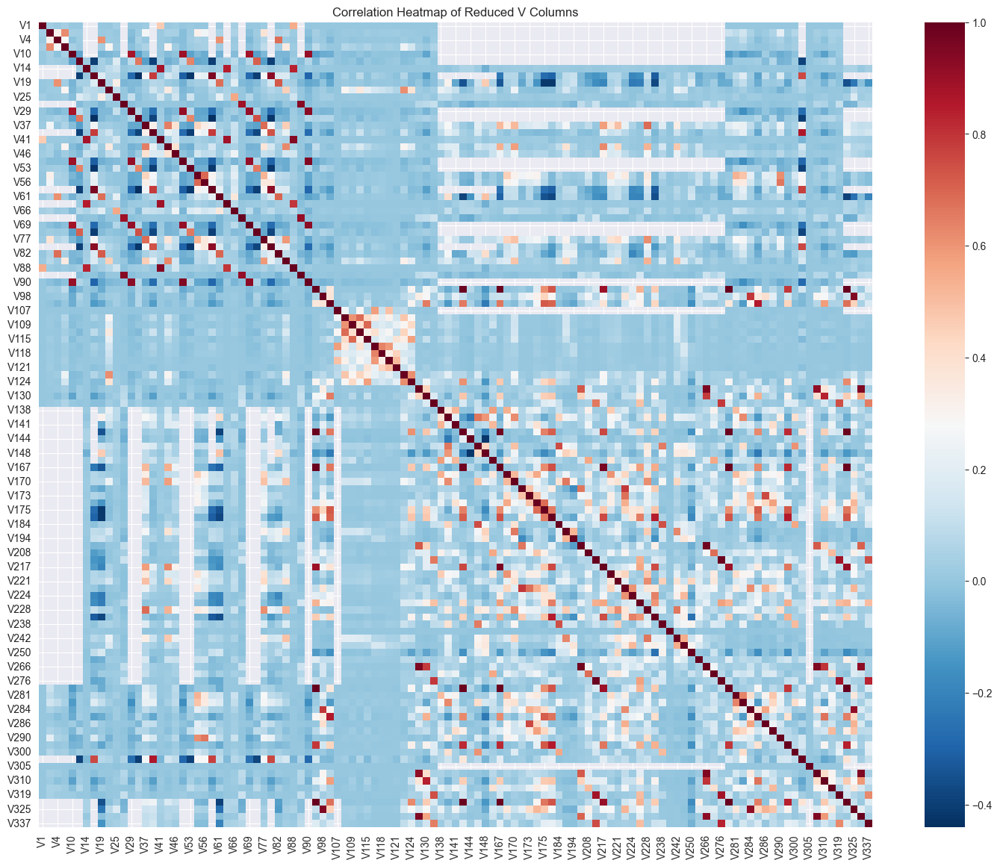

In [74]:
V = tranz[v_red_col_sorted_v]
plt.figure(figsize=(18, 14))
sns.heatmap(V.corr(), cmap='RdBu_r')
plt.title('Correlation Heatmap of Reduced V Columns')
plt.show()